# Setup data for experiments

## Imports

In [1]:
# Standard library imports
import time
import os

# 3rd party imports
import numpy as np
np.set_printoptions(linewidth=2000, threshold=10000)
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pprint import pprint
from scipy.ndimage import zoom
import SimpleITK as sitk

# Importing custom modules
from modules import laplacian
from modules import jacobian
from modules import correspondences

## Functions

In [2]:
def plot_deformation(msample, fsample, deformation, title="", figsize=(20, 10), show_values=True, show_points=True, save_path=None, quiver_scale=None):
    """
    Plots the deformation field between two sets of points.
    """
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    
    # Calculate the Jacobian determinant
    J = np.squeeze(jacobian.sitk_jacobian_determinant(deformation))
    num_neg_J = np.sum(J <= 0)
    norm = mcolors.TwoSlopeNorm(vmin=min(J.min(), J.min(), -3), vcenter=0, vmax=max(J.max(), J.max(), 3))

    # Draw lines connecting the points in the first subplot
    for i in range(len(msample)):  # Draw lines connecting the points
        axs[0].annotate(
            '', 
            xy=(fsample[i][2], fsample[i][1]), 
            xytext=(msample[i][2], msample[i][1]), 
            arrowprops=dict(facecolor='black', shrink=0.045, headwidth=8, headlength=10, width=3)
        )
    
    # Create a grid of points
    x, y = np.meshgrid(range(deformation.shape[3]), range(deformation.shape[2]), indexing='xy')

    # Plot the initial points and Jacobian determinant scores
    im = axs[0].imshow(J, cmap='seismic', norm=norm)
    axs[0].set_title(f"Jacobian determinant grid\n({num_neg_J} negative Jacobian values)")

    if show_values:
        # Add text for the values
        for i in range(J.shape[0]):
            for j in range(J.shape[1]):
                axs[0].text(j, i, f"{J[i, j]:.2f}", ha="center", va="center", color="black", fontsize=8)
        
        for i in range(J.shape[0]):
            for j in range(J.shape[1]):
                axs[1].text(j, i + 0.3, f"{J[i, j]:.2f}", ha="center", va="center", color="black", fontsize=8)

    # Plot the deformation vectors
    axs[1].set_title(f"Deformation vector field")
    axs[1].imshow(J, cmap='seismic', norm=norm)
    #pprint(deformation[2, 0])
    #print(np.max(deformation[2, 0]))
    #pprint(deformation[1, 0])
    #print(np.max(deformation[1, 0]))
    if quiver_scale is None:
        axs[1].quiver(x, y, deformation[2,0], -deformation[1,0])
    else:
        axs[1].quiver(x, y, deformation[2,0], -deformation[1,0], scale=quiver_scale, scale_units='xy')
    
    
    if show_points:
        axs[0].scatter(msample[:, 2], msample[:, 1], c='g', label='Moving')
        axs[0].scatter(fsample[:, 2], fsample[:, 1], c='violet', label='Fixed')
        axs[0].legend()
        axs[1].scatter(msample[:, 2], msample[:, 1], c='g', label='Moving')
        axs[1].scatter(fsample[:, 2], fsample[:, 1], c='violet', label='Fixed')
        axs[1].legend()
    
    # Draw very light grid lines between moving and fixed points
    for i in range(len(msample)):
        axs[1].plot(
            [msample[i][2], fsample[i][2]],
            [msample[i][1], fsample[i][1]],
            color='gray',
            linestyle='--',
            linewidth=1,
            alpha=0.5,
            zorder=1
        )
    
    # Invert y-axes
    #axs[0].invert_yaxis()
    #axs[1].invert_yaxis()
    
    # Set titles
    fig.suptitle(title, fontsize=16)
    
    # Add colorbar that matches the height of the axes
    divider = make_axes_locatable(axs[1])
    cax = divider.append_axes("right", size="5%", pad=0.15)
    cbar = fig.colorbar(im, cax=cax)
    cbar.set_label('Jacobian determinant')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path.replace('.npy', '.png'), bbox_inches='tight')
        
    plt.show()
    
    
def show_data(msample, fsample, fixed_sample, title="Deformation Field", figsize=(20, 10), show_values=True, show_points=True, save_path=None):
    """
    Displays the deformation field between two sets of points.
    """
    deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(fixed_sample, msample, fsample)
    np.save(save_path, deformation)
    print(title)
    print(f"Deformation field shape: {deformation.shape[2]} x {deformation.shape[3]}")
    print(f"Number of non-positive Jacobian values: {np.sum(jacobian.sitk_jacobian_determinant(deformation) <= 0)}")
    plot_deformation(msample, fsample, deformation, title=title, figsize=figsize, show_values=show_values, show_points=show_points, save_path=save_path)
    return deformation

## Generate and process DVFs

In [3]:
def generate_random_dvf(shape, max_magnitude=5.0, seed=None):
    """
    Generate a random 2D deformation vector field (DVF).
    
    Parameters:
        shape: tuple (3, 1, H, W)
        max_magnitude: float, max displacement in pixels
        seed: int or None, for reproducibility

    Returns:
        np.ndarray of shape (3, 1, H, W)
    """
    if seed is not None:
        np.random.seed(seed)

    C, _, H, W = shape
    assert C == 3, "DVF must have 3 channels (dz, dy, dx)"
    
    # Uniform random displacement in range [-max_magnitude, +max_magnitude]
    dvf = np.random.uniform(-max_magnitude, max_magnitude, size=shape).astype(np.float32)
    return dvf


def scale_dvf_numpy(dvf, new_size):
    """
    Downscale a deformation vector field (DVF).
    dvf: np.ndarray of shape (3, 1, H, W)
    new_size: (new_H, new_W)
    """
    C, _, H, W = dvf.shape
    new_H, new_W = new_size
    scale_y = new_H / H
    scale_x = new_W / W

    dvf_resized = np.zeros((C, 1, new_H, new_W), dtype=dvf.dtype)
    for c in range(C):
        # zoom along spatial dimensions
        dvf_resized[c, 0] = zoom(dvf[c, 0], (scale_y, scale_x), order=1)

    # scale vector magnitudes appropriately
    dvf_resized[2, 0] *= scale_x  # x
    dvf_resized[1, 0] *= scale_y  # y
    #dvf_resized[2, 0] *= (scale_x + scale_y) / 2  # z, if needed

    return dvf_resized

## Load real data

In [4]:
def load_slice(idx, mpoints_path="data/corrected_correspondences_count_touching/mpoints.npy", fpoints_path="data/corrected_correspondences_count_touching/fpoints.npy", 
               scale_factor=1.0, show_values=False, show_points=False, title="", quiver_scale=None, downscale_field=True,
               save_path=None):
    """
    Load a specific slice of moving and fixed points from the given paths.
    """
    msample = np.load(mpoints_path)
    fsample = np.load(fpoints_path)
    
    fixed_sample = np.zeros((1, 320, 456))  # Adjusted size for smaller resolution

    # Filter points for the specified slice
    mask_m = msample[:, 0] == idx
    mask_f = fsample[:, 0] == idx

    new_mpoints = msample[mask_m].copy()
    new_fpoints = fsample[mask_f].copy()

    new_mpoints[:, 0] = 0
    new_fpoints[:, 0] = 0
    
    downscaled_mpoints = np.round(new_mpoints[:, :] * scale_factor).astype(int)
    downscaled_fpoints = np.round(new_fpoints[:, :] * scale_factor).astype(int)
    
    # Downscale the deformation field
    if downscale_field:
        # Create a deformation field with Laplacian
        deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(fixed_sample, new_mpoints, new_fpoints)
        # Upscale or downscale the deformation field based on the scale factor
        if scale_factor != 1.0:
            deformation = scale_dvf_numpy(deformation, (int(320 * scale_factor), int(456 * scale_factor)))
    else:
        # Create a deformation field with Laplacian without downscaling the field
        fixed_sample = np.zeros((1, int(320 * scale_factor), int(456 * scale_factor)))  # Adjusted size for smaller resolution
        deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(fixed_sample, downscaled_mpoints, downscaled_fpoints)
    
    if save_path:
        np.save(save_path, deformation)
        
    print(title)
    print(f"Deformation field shape: {deformation.shape[2]} x {deformation.shape[3]}")
    print(f"Number of non-positive Jacobian values: {np.sum(jacobian.sitk_jacobian_determinant(deformation) <= 0)}")
    if downscale_field:
        plot_deformation(new_mpoints, new_fpoints, deformation, title=title, figsize=(20, 10), show_values=show_values, show_points=show_points, save_path=save_path, quiver_scale=quiver_scale)
    else:
        plot_deformation(downscaled_mpoints, downscaled_fpoints, deformation, title=title, figsize=(20, 10), show_values=show_values, show_points=show_points, save_path=save_path, quiver_scale=quiver_scale)
        
    return deformation

## Data setup

### Case 1 - Small test cases

#### Case 1a - 10x10 crossing points

Case 1a - 10x10 crossing points
Deformation field shape: 10 x 10
Number of non-positive Jacobian values: 9


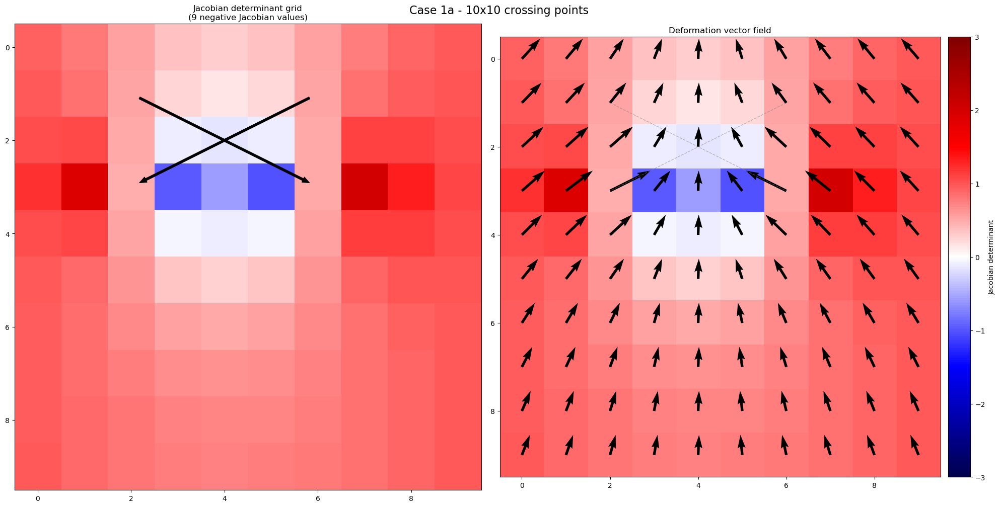

In [38]:
# Data title and where to save the output and results
title = "Case 1a - 10x10 crossing points"
save_path = "experiments/01a_10x10_crossing.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 1, 2],
    [0, 1, 6],
])
fsample = np.array([
    [0, 3, 6],
    [0, 3, 2],
])
resolution = (10, 10)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#### Case 1b - 10x10 opposites

Case 1b - 10x10 opposite
Deformation field shape: 10 x 10
Number of non-positive Jacobian values: 5


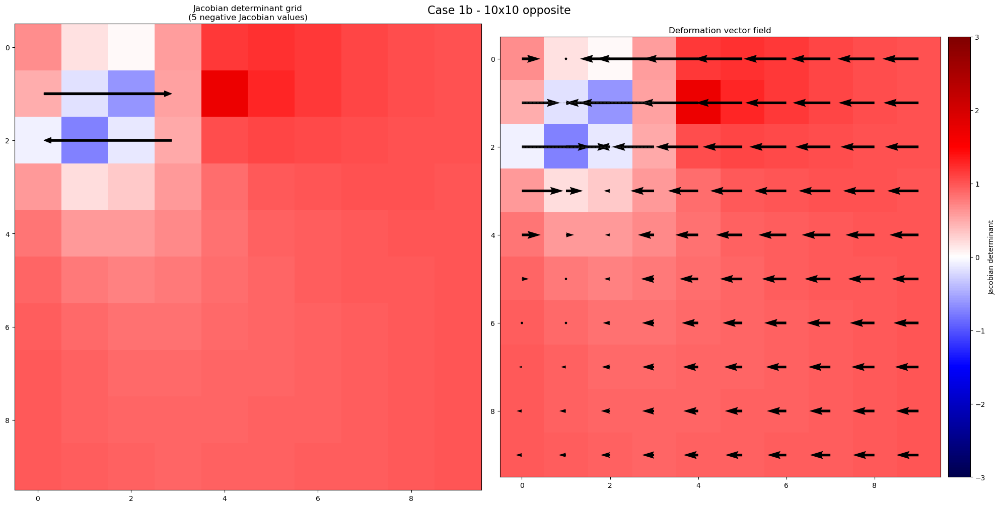

In [28]:
# Data title and where to save the output and results
title = "Case 1b - 10x10 opposite"
save_path = "experiments/01b_10x10_opposite.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 1, 0],
    [0, 2, 3],
])
fsample = np.array([
    [0, 1, 3],
    [0, 2, 0],
])

resolution = (10, 10)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#### Case 1c - 20x40 edges

Case 1c - 20x40 edges
Deformation field shape: 20 x 40
Number of non-positive Jacobian values: 29


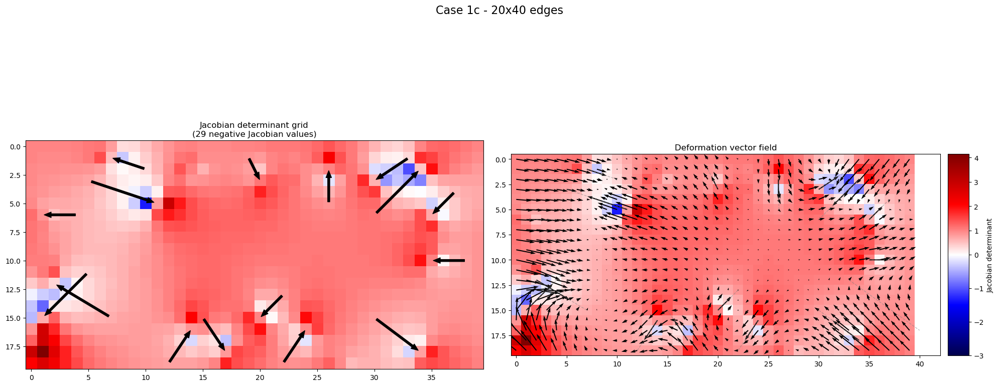

In [29]:
# Data title and where to save the output and results
title = "Case 1c - 20x40 edges"
save_path = "experiments/01c_20x40_edges.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 2, 10],
    [0, 3, 5],
    [0, 6, 4],
    [0, 11, 5],
    [0, 15, 7],
    [0, 19, 12],
    [0, 15, 15],
    [0, 13, 22],
    [0, 19, 22],
    [0, 19, 27],
    [0, 15, 30],
    [0, 12, 33],
    [0, 10, 38],
    [0, 4, 37],
    [0, 6, 30],
    [0, 1, 33],
    [0, 5, 26],
    [0, 2, 23],
    [0, 1, 19],
    [0, 2, 14],
])
fsample = np.array([
    [0, 1, 7],
    [0, 5, 11],
    [0, 6, 1],
    [0, 15, 1],
    [0, 12, 2],
    [0, 16, 14],
    [0, 18, 17],
    [0, 15, 20],
    [0, 16, 24],
    [0, 19, 27],
    [0, 18, 34],
    [0, 17, 40],
    [0, 10, 35],
    [0, 6, 35],
    [0, 2, 34],
    [0, 3, 30],
    [0, 2, 26],
    [0, 2, 23],
    [0, 3, 20],
    [0, 2, 14],
])

resolution = (20, 40)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#### Case 1d - 20x40 crossing points

Case 1d - 20x40 crossing points
Deformation field shape: 20 x 40
Number of non-positive Jacobian values: 158


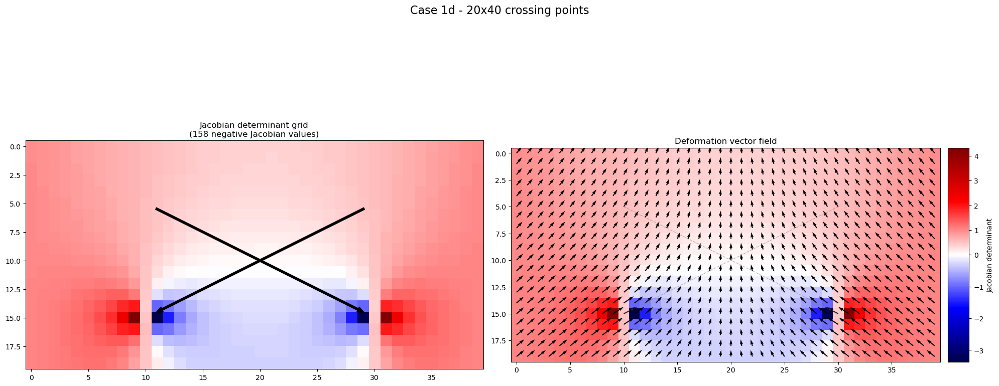

In [30]:
# Data title and where to save the output and results
title = "Case 1d - 20x40 crossing points"
save_path = "experiments/01d_20x40_crossing.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 5, 10],
    [0, 5, 30],
])
fsample = np.array([
    [0, 15, 30],
    [0, 15, 10],
])

resolution = (20, 40)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#### Case 1e - 20x20 spirals

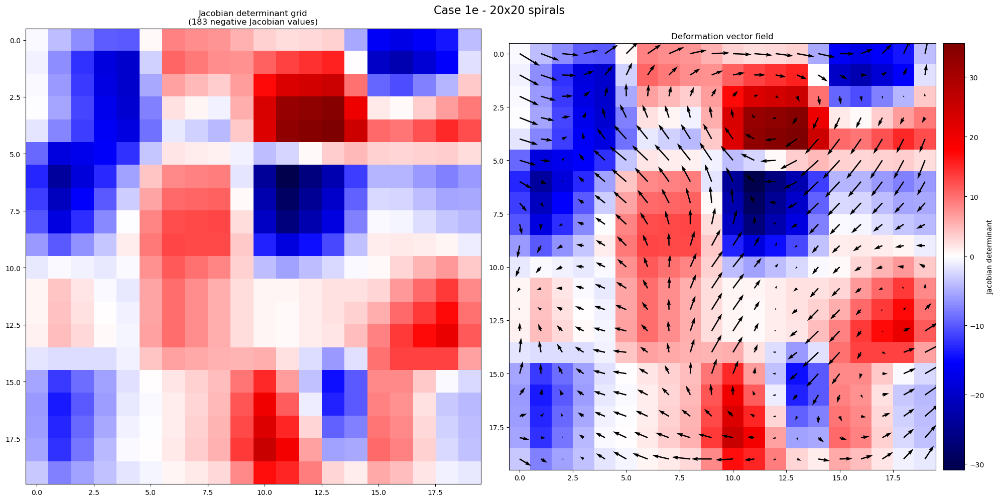

In [31]:
title = "Case 1e - 20x20 spirals"
save_path = "experiments/01e_20x20_random_spirals.npy"
resolution = (20, 20)  # y, x (height x width)

# Start with an initial DVF
original_shape = (3, 1, 5, 5)

# Generate initial random DVF
dvf = generate_random_dvf(original_shape, max_magnitude=5.0, seed=42)
dvf = scale_dvf_numpy(dvf, new_size=resolution)

# Show and save the experiment data
np.save(save_path, dvf)
_ = plot_deformation(np.array([[0, 0, 0]]), np.array([[0, 0, 0]]), dvf, title=title, show_values=False, show_points=False, save_path=save_path)

#### Case 1f - 20x20 random

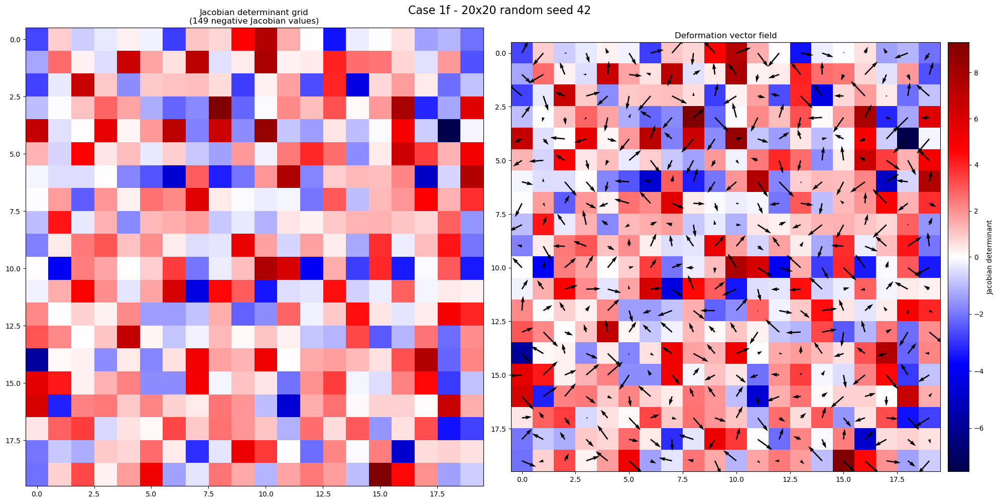

In [32]:
title = "Case 1f - 20x20 random seed 42"
save_path = "experiments/01f_20x20_random_seed_42.npy"
resolution = (20, 20)  # y, x (height x width)

# Start with an initial DVF
original_shape = (3, 1, resolution[0], resolution[1])
dvf = generate_random_dvf(original_shape, max_magnitude=3.0, seed=42)

# Show and save the experiment data
np.save(save_path, dvf)
_ = plot_deformation(np.array([[0, 0, 0]]), np.array([[0, 0, 0]]), dvf, title=title, show_values=False, show_points=False, save_path=save_path)

### Case 2 - Real data

#### Case 2a - Real data 64x91 slice 90

Case 2a - Real data slice 90, downscaled to 20% (64 x 91)
Deformation field shape: 64 x 91
Number of non-positive Jacobian values: 3


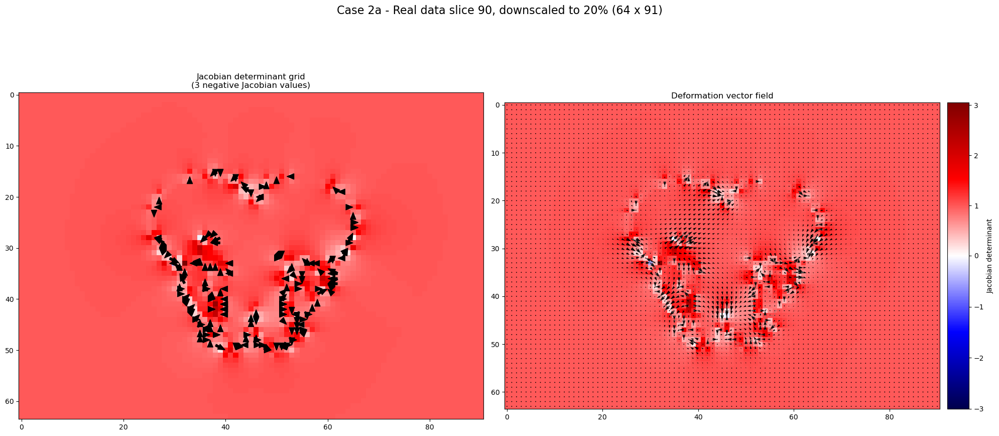

In [33]:
slice_idx = 90
scale_factor = 0.2  # Downscale to 20% of original size (64 x 91)
title = f"Case 2a - Real data slice {slice_idx}, downscaled to 20% (64 x 91)"
save_path = f"experiments/02a_64x91_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

Full resolution

Case 2a - Real data slice 90, (320 x 456)
Deformation field shape: 320 x 456
Number of non-positive Jacobian values: 120


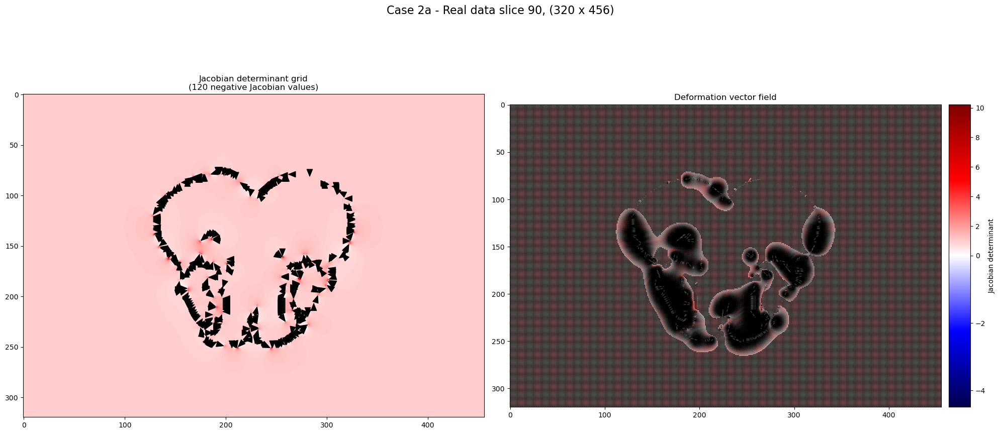

In [9]:
slice_idx = 90
scale_factor = 1.0  # Downscale to 20% of original size (64 x 91)
title = f"Case 2a - Real data slice {slice_idx}, (320 x 456)"
save_path = f"experiments/02a_320x456_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

#### Case 2b - Real data 64x91 slice 200

Case 2b - Real data slice 200, downscaled to 20% (64 x 91)
Deformation field shape: 64 x 91
Number of non-positive Jacobian values: 4


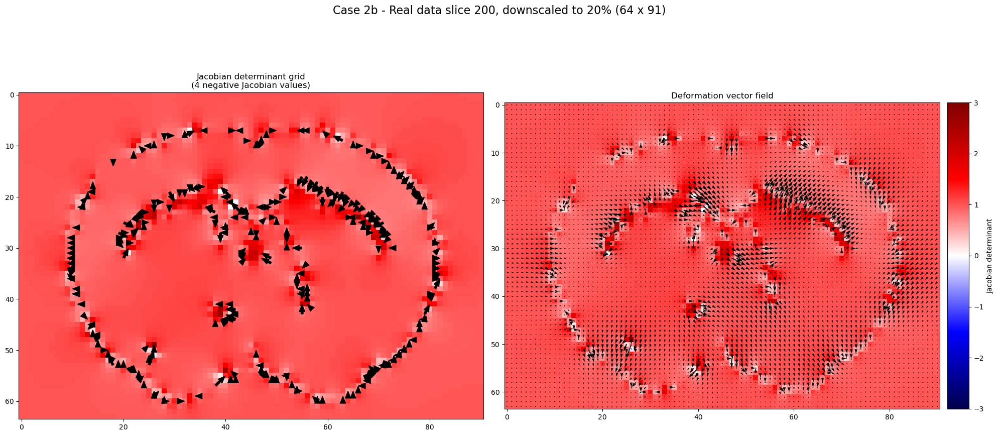

In [34]:
slice_idx = 200
scale_factor = 0.2  # Downscale to 20% of original size (64 x 91)
title = f"Case 2b - Real data slice {slice_idx}, downscaled to 20% (64 x 91)"
save_path = f"experiments/02b_64x91_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

Full resolution

Case 2b - Real data slice 200, (320 x 456)
Deformation field shape: 320 x 456
Number of non-positive Jacobian values: 137


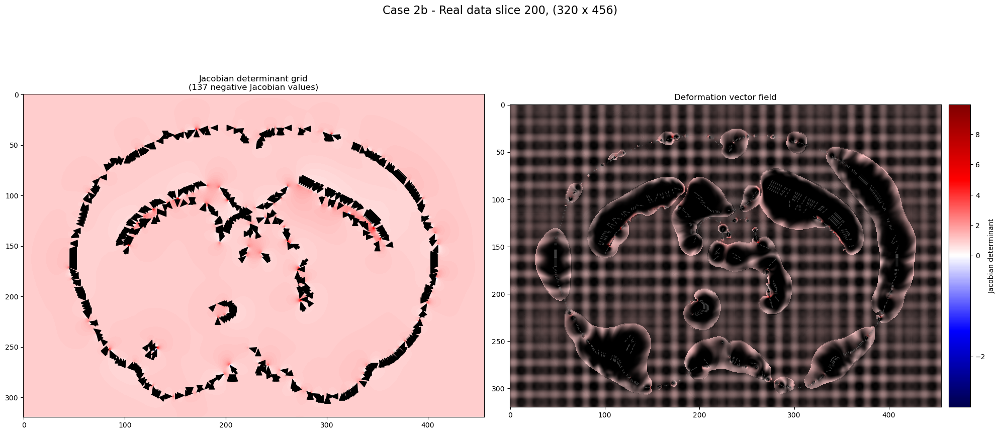

In [6]:
slice_idx = 200
scale_factor = 1.0  # Downscale to 20% of original size (64 x 91)
title = f"Case 2b - Real data slice {slice_idx}, (320 x 456)"
save_path = f"experiments/02b_320x456_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

#### Case 2c - Real data 64x91 slice 350

Case 2c - Real data slice 350, downscaled to 20% (64 x 91)
Deformation field shape: 64 x 91
Number of non-positive Jacobian values: 3


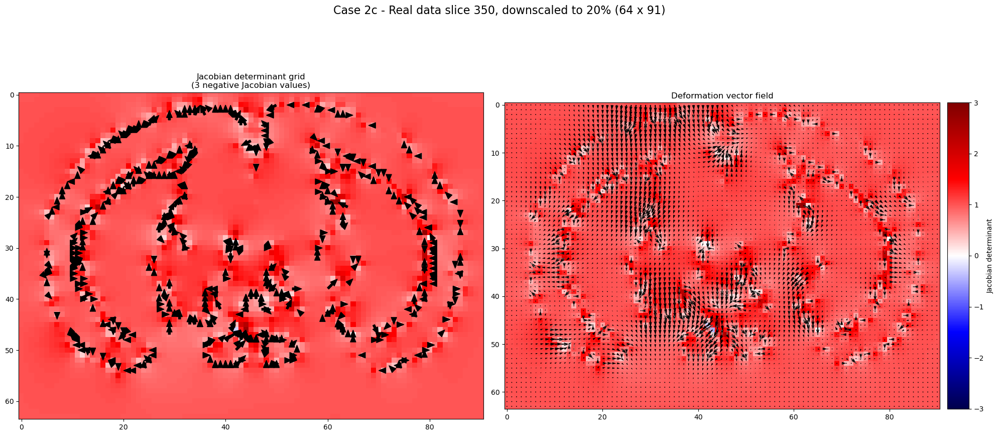

In [35]:
slice_idx = 350
scale_factor = 0.2  # Downscale to 20% of original size (64 x 91)
title = f"Case 2c - Real data slice {slice_idx}, downscaled to 20% (64 x 91)"
save_path = f"experiments/02c_64x91_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

Full resolution

Case 2a - Real data slice 350, (320 x 456)
Deformation field shape: 320 x 456
Number of non-positive Jacobian values: 168


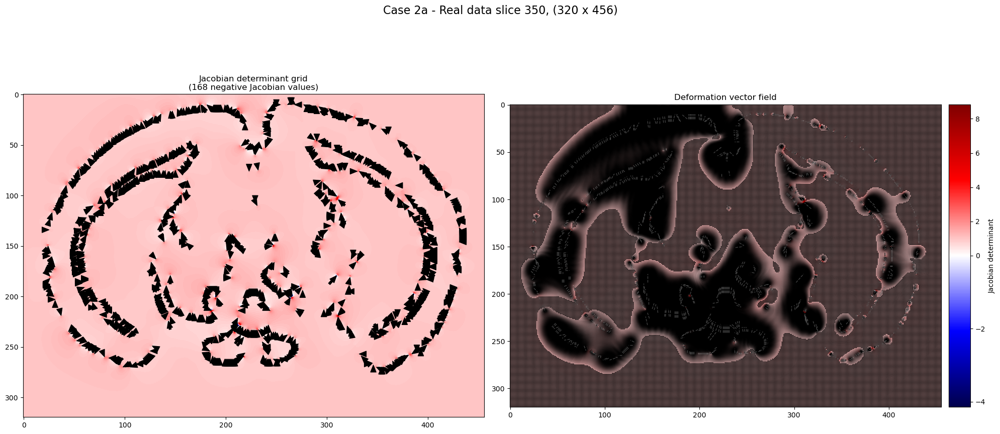

In [7]:
slice_idx = 350
scale_factor = 1.0  # Downscale to 20% of original size (64 x 91)
title = f"Case 2a - Real data slice {slice_idx}, (320 x 456)"
save_path = f"experiments/02c_320x456_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

#### Case 2d - Real data 64x91 slice 500

Case 2d - Real data slice 500, downscaled to 20% (64 x 91)
Deformation field shape: 64 x 91
Number of non-positive Jacobian values: 3


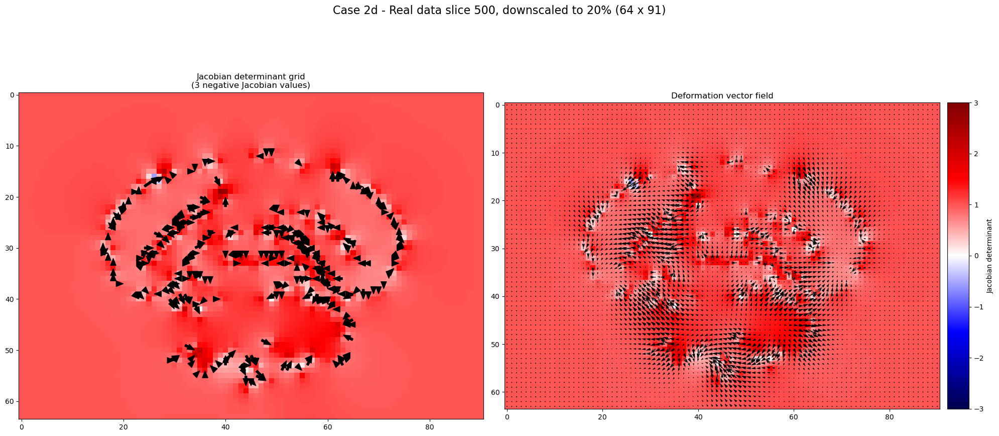

In [37]:
slice_idx = 500
scale_factor = 0.2  # Downscale to 20% of original size (64 x 91)
title = f"Case 2d - Real data slice {slice_idx}, downscaled to 20% (64 x 91)"
save_path = f"experiments/02d_64x91_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

Full resolution

Case 2d - Real data slice 500, (320 x 456)
Deformation field shape: 320 x 456
Number of non-positive Jacobian values: 156


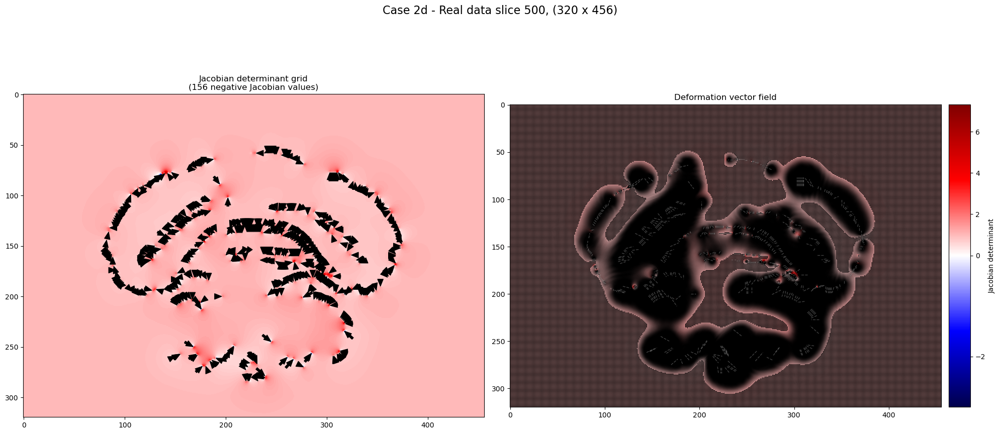

In [8]:
slice_idx = 500
scale_factor = 1.0  # Downscale to 20% of original size (64 x 91)
title = f"Case 2d - Real data slice {slice_idx}, (320 x 456)"
save_path = f"experiments/02d_320x456_slice{slice_idx}.npy"

_ = load_slice(slice_idx, scale_factor=scale_factor, downscale_field=False,
               show_values=False, show_points=False, title=title, save_path=save_path, quiver_scale=1)

### Case 3 - Smaller data generation

#### 10x10 - opposites

Case 3a - 10x10 opposites
Deformation field shape: 10 x 10
Number of non-positive Jacobian values: 11


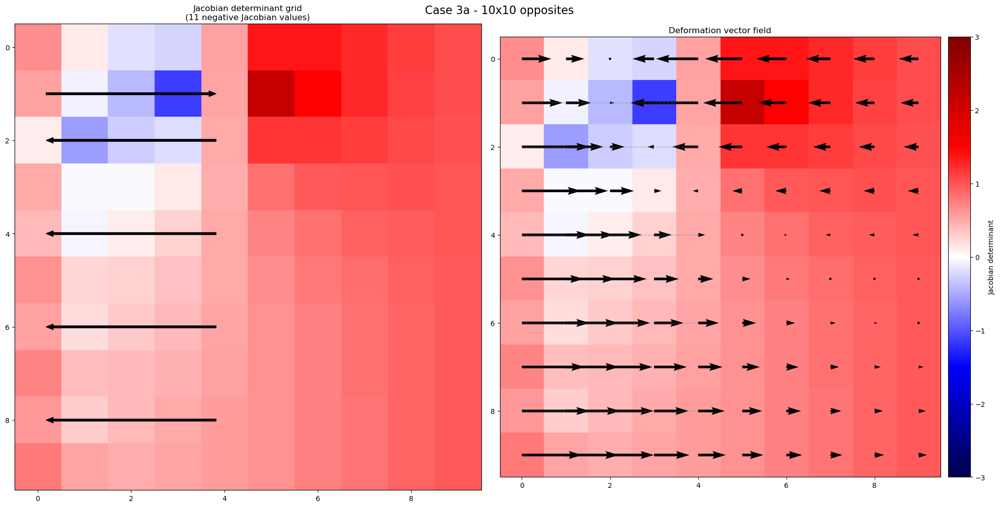

In [133]:
# Data title and where to save the output and results
title = "Case 3a - 10x10 opposites"
save_path = "experiments/03a_10x10_opposite.npy"

# Sample moving and fixed points
msample = np.array([
    # Opposites
    [0, 1, 0],
    [0, 2, 4],
    
    # Flow left
    [0, 4, 4],
    [0, 6, 4],
    [0, 8, 4],
    
])
fsample = np.array([
    # Opposites
    [0, 1, 4],
    [0, 2, 0],
    
    # Flow left
    [0, 4, 0],
    [0, 6, 0],
    [0, 8, 0],
])
resolution = (10, 10)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#deformation = np.load(save_path)

#### 10x10 - 1 spirals

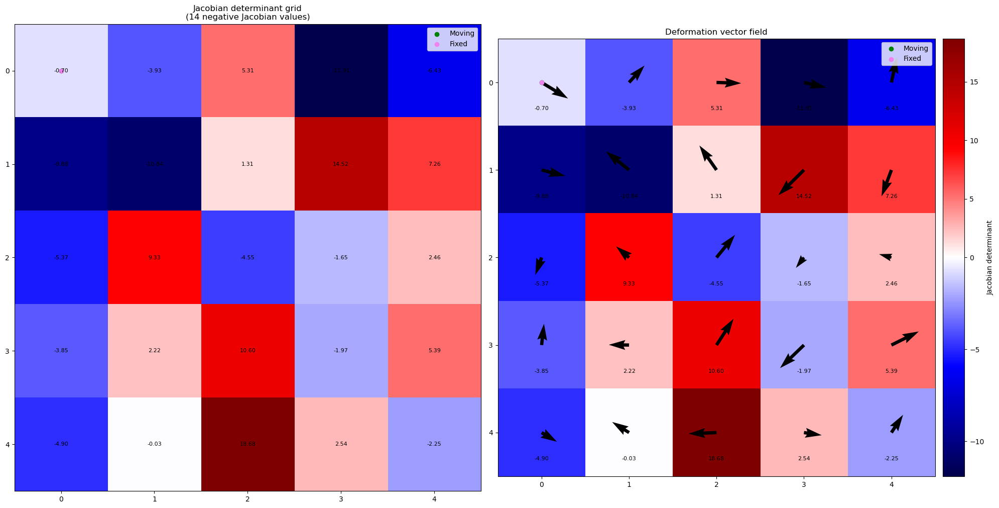

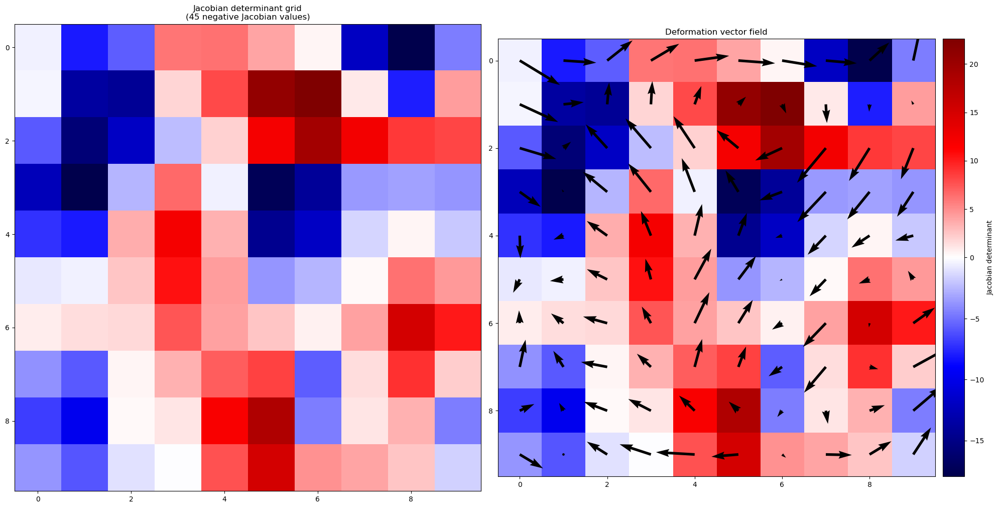

In [12]:
# Start with an initial DVF
original_shape = (3, 1, 5, 5)
new_size = (10, 10)
save_path = "experiments/03a_10x10_random_seed_42.npy"

# Generate initial random DVF
dvf = generate_random_dvf(original_shape, max_magnitude=5.0, seed=42)
plot_deformation(
    msample=np.array([[0, 0, 0]]),
    fsample=np.array([[0, 0, 0]]),
    deformation=dvf)

# Now make a sequence of upscaled DVFs
dvf_temp = scale_dvf_numpy(dvf, new_size=new_size)
plot_deformation(
    msample=np.array([[0, 0, 0]]),
    fsample=np.array([[0, 0, 0]]),
    deformation=dvf_temp,
    show_points= False, show_values=False, save_path=save_path)

np.save(save_path, dvf_temp)

#### 10x10 - 2 crossing

Case 3b - 10x10 crossing points
Deformation field shape: 10 x 10
Number of non-positive Jacobian values: 16


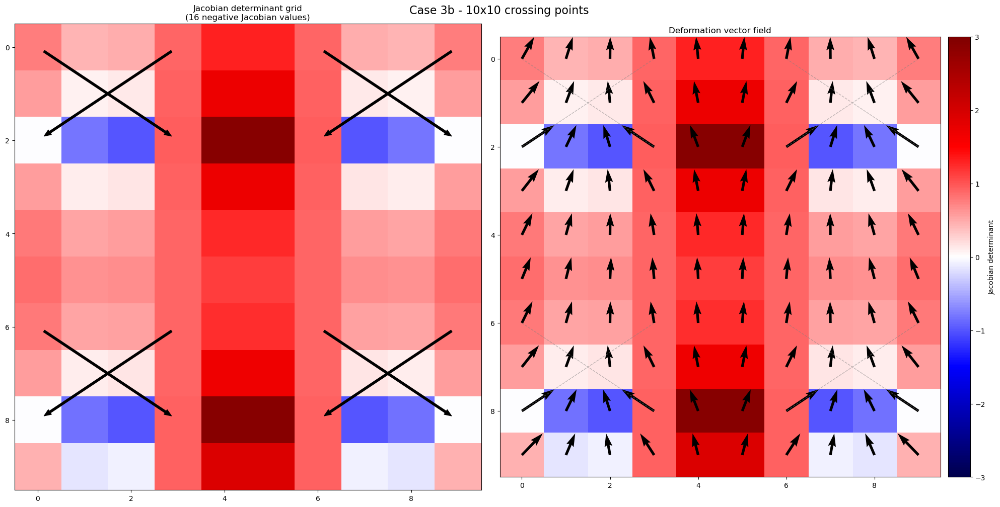

In [31]:
# Data title and where to save the output and results
title = "Case 3b - 10x10 crossing points"
save_path = "experiments/03b_10x10_crossing.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 0, 0],
    [0, 0, 3],
    
    [0, 0, 6],
    [0, 0, 9],
    
    # 2nd row
    [0, 6, 0],
    [0, 6, 3],
    
    [0, 6, 6],
    [0, 6, 9],
])
fsample = np.array([
    [0, 2, 3],
    [0, 2, 0],
    
    [0, 2, 9],
    [0, 2, 6],
    
    # Second set
    [0, 8, 3],
    [0, 8, 0],
    
    [0, 8, 9],
    [0, 8, 6],
])
resolution = (10, 10)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#### 20x20 - opposites

Case 3c - 20x20 opposites
Deformation field shape: 20 x 20
Number of non-positive Jacobian values: 32


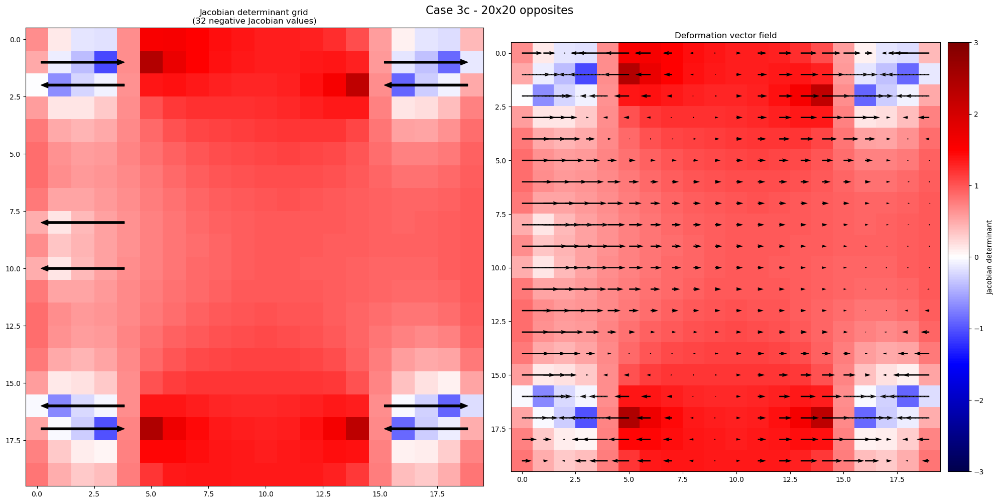

In [143]:
# Data title and where to save the output and results
title = "Case 3c - 20x20 opposites"
save_path = "experiments/03c_20x20_opposite.npy"

# Sample moving and fixed points
msample = np.array([
    # Opposites
    [0, 1, 0],
    [0, 2, 4],
    
    # Flow left
    [0, 8, 4],
    [0, 10, 4],
    
    # Opposites
    [0, 16, 4],
    [0, 17, 0],
    
    # Opposites
    [0, 1, 15],
    [0, 2, 19],
    
    # Opposites
    [0, 16, 15],
    [0, 17, 19],
    
])
fsample = np.array([
    # Opposites
    [0, 1, 4],
    [0, 2, 0],
    
    # Flow left
    [0, 8, 0],
    [0, 10, 0],
    
    [0, 16, 0],
    [0, 17, 4],
    
    # Opposites
    [0, 1, 19],
    [0, 2, 15],
    
    # Opposites
    [0, 16, 19],
    [0, 17, 15],
    
])
resolution = (20, 20)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

#deformation = np.load(save_path)

#### 20x20 - 3 spirals

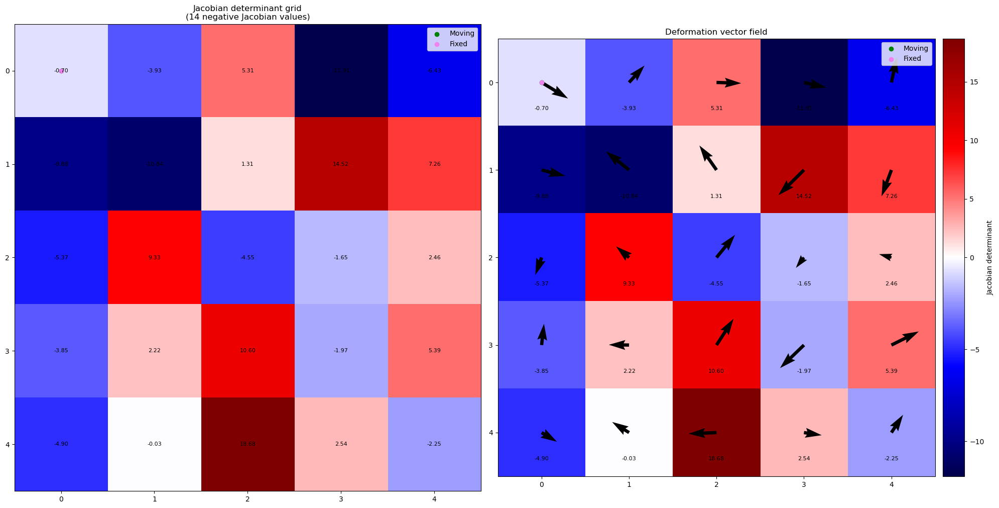

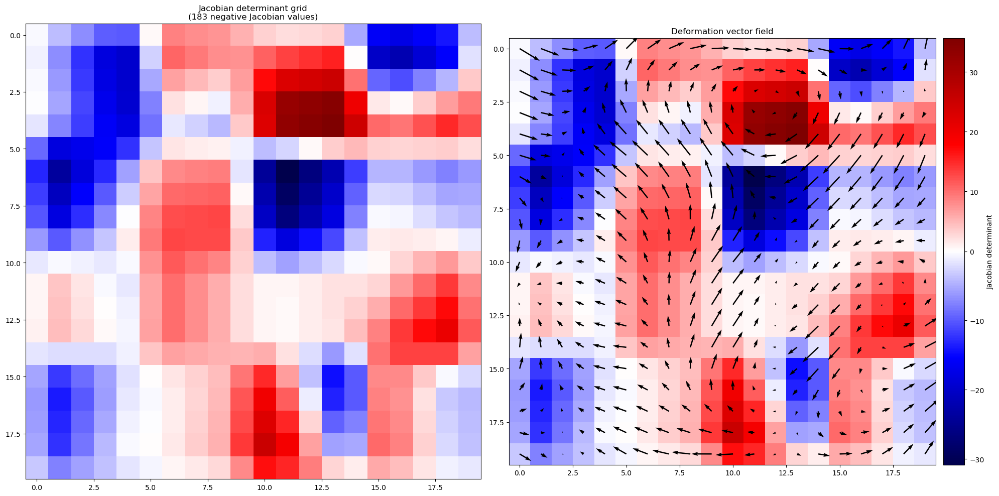

In [18]:
# Start with an initial DVF
original_shape = (3, 1, 5, 5)
new_size = (20, 20)
save_path = "experiments/03c_20x20_random_seed_42.npy"

# Generate initial random DVF
dvf = generate_random_dvf(original_shape, max_magnitude=5.0, seed=42)
plot_deformation(
    msample=np.array([[0, 0, 0]]),
    fsample=np.array([[0, 0, 0]]),
    deformation=dvf)

# Now make a sequence of upscaled DVFs
dvf_temp = scale_dvf_numpy(dvf, new_size=new_size)
plot_deformation(
    msample=np.array([[0, 0, 0]]),
    fsample=np.array([[0, 0, 0]]),
    deformation=dvf_temp,
    show_points= False, show_values=False, save_path=save_path)

np.save(save_path, dvf_temp)

#### 20x20 - 4 crossing

Case 3d - 20x20 crossing points
Deformation field shape: 20 x 20
Number of non-positive Jacobian values: 28


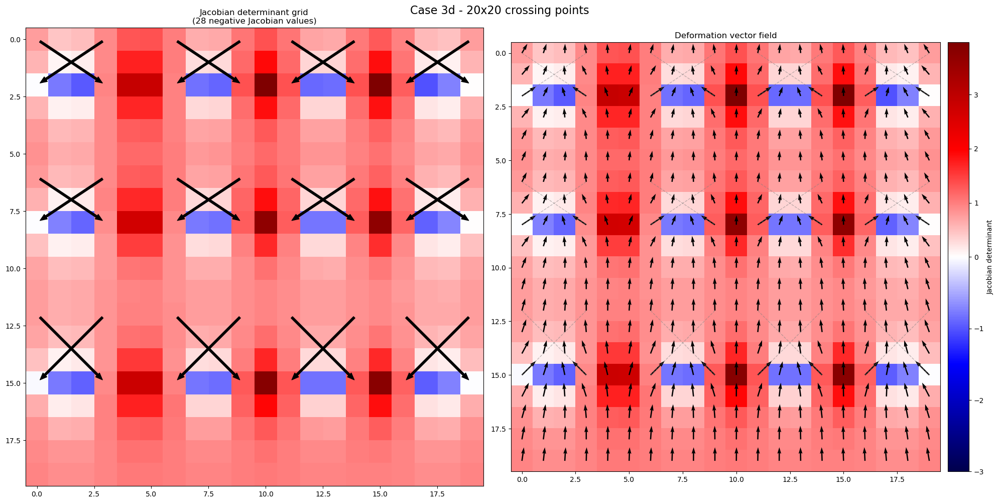

In [168]:
# Data title and where to save the output and results
title = "Case 3d - 20x20 crossing points"
save_path = "experiments/03d_20x20_crossing.npy"

# Sample moving and fixed points
msample = np.array([
    [0, 0, 0],
    [0, 0, 3],
    
    [0, 0, 6],
    [0, 0, 9],
    
    [0, 0, 11],
    [0, 0, 14],
    
    [0, 0, 16],
    [0, 0, 19],
    
    # 2nd row
    [0, 6, 0],
    [0, 6, 3],
    
    [0, 6, 6],
    [0, 6, 9],
    
    [0, 6, 11],
    [0, 6, 14],
    
    [0, 6, 16],
    [0, 6, 19],
    
    # 3rd row
    [0, 12, 0],
    [0, 12, 3],
    
    [0, 12, 6],
    [0, 12, 9],
    
    [0, 12, 11],
    [0, 12, 14],
    
    [0, 12, 16],
    [0, 12, 19],
])
fsample = np.array([
    [0, 2, 3],
    [0, 2, 0],
    
    [0, 2, 9],
    [0, 2, 6],
    
    [0, 2, 14],
    [0, 2, 11],
    
    [0, 2, 19],
    [0, 2, 16],
    
    # 2nd set
    [0, 8, 3],
    [0, 8, 0],
    
    [0, 8, 9],
    [0, 8, 6],
    
    [0, 8, 14],
    [0, 8, 11],
    
    [0, 8, 19],
    [0, 8, 16],
    
    # 3rd set
    [0, 15, 3],
    [0, 15, 0],
    
    [0, 15, 9],
    [0, 15, 6],
    
    [0, 15, 14],
    [0, 15, 11],
    
    [0, 15, 19],
    [0, 15, 16],
])
resolution = (20, 20)  # y, x (height x width)

##############################################################################################################

# Show and save the experiment data
_ = show_data(msample, fsample, np.zeros((1, resolution[0], resolution[1])), 
              title=title, figsize=(20, 10), show_values=False, show_points=False,
              save_path=save_path)

# Create for checkboard example

In [51]:
# Import standard libraries
from functools import partial

# Import third-party libraries
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import geometric_transform

# Import local modules
from modules import jacobian

def shift3Dfunc(point, dx, dy, dz):
    px = point[0] + dx[point[0], point[1],  point[2]]
    py = point[1] + dy[point[0], point[1],  point[2]]
    pz = point[2] + dz[point[0], point[1],  point[2]]
    if(px<0 or px> dx.shape[0]):
        return (point[0], point[1], point[2])
    if(py<0 or py> dx.shape[1]):
        return (point[0], point[1], point[2])
    if(pz<0 or pz> dx.shape[2]):
        return (point[0], point[1], point[2])
    return (px, py, pz)

In [52]:
def create_checkerboard(num_squares=(8, 8), final_resolution=(400, 400)):
    """
    Create a checkerboard image with a specified final resolution.

    Parameters:
        num_squares (tuple): Number of squares (rows, cols) in the checkerboard.
        final_resolution (tuple): Final image resolution (height, width) in pixels.

    Returns:
        numpy.ndarray: Checkerboard image as a 2D NumPy array.
    """
    rows, cols = num_squares
    height, width = final_resolution
    square_height = height // rows
    square_width = width // cols

    base_pattern = np.indices((rows, cols)).sum(axis=0) % 2
    checkerboard = np.kron(base_pattern, np.ones((square_height, square_width)))

    # Crop to exact resolution if necessary
    checkerboard = checkerboard[:height, :width]
    return checkerboard

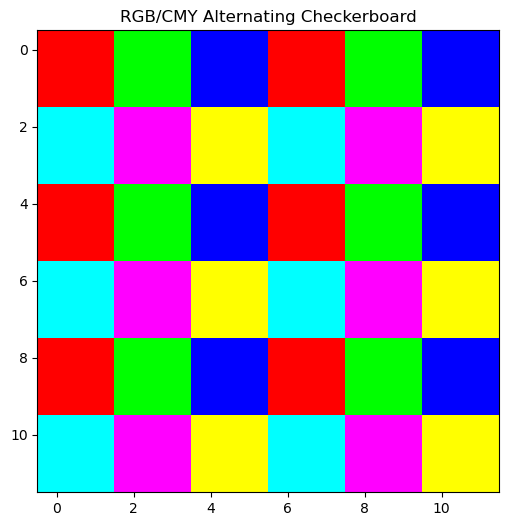

In [58]:
def create_rgb_cmy_checkerboard_alt_rows(num_squares=(8, 8), final_resolution=(400, 400)):
    """
    Create a color checkerboard image with alternating RGB and CMY rows.
    Even rows: R, G, B; Odd rows: C, M, Y.
    Returns a (H, W, 3) RGB image.
    """
    rows, cols = num_squares
    height, width = final_resolution
    square_height = height // rows
    square_width = width // cols

    # 0: R or C, 1: G or M, 2: B or Y
    base_pattern = np.zeros((rows, cols), dtype=int)
    for i in range(rows):
        base_pattern[i, :] = np.arange(cols) % 3

    checkerboard = np.kron(base_pattern, np.ones((square_height, square_width)))
    checkerboard = checkerboard[:height, :width]

    rgb = np.zeros((height, width, 3), dtype=np.float32)
    for i in range(rows):
        row_start = i * square_height
        row_end = min((i + 1) * square_height, height)
        if i % 2 == 0:
            # RGB rows
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 0, 0] = 1.0  # Red
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 1, 1] = 1.0  # Green
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 2, 2] = 1.0  # Blue
        else:
            # CMY rows: C=(0,1,1), M=(1,0,1), Y=(1,1,0)
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 0] = [0, 1, 1]  # Cyan
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 1] = [1, 0, 1]  # Magenta
            rgb[row_start:row_end][checkerboard[row_start:row_end] == 2] = [1, 1, 0]  # Yellow

    return rgb

# Example usage
num_squares = (6, 6)
final_resolution = (12, 12)
rgb_cmy_checkerboard = create_rgb_cmy_checkerboard_alt_rows(num_squares=num_squares, final_resolution=final_resolution)

plt.figure(figsize=(6, 6))
plt.imshow(rgb_cmy_checkerboard)
plt.title('RGB/CMY Alternating Checkerboard')
plt.show()

In [73]:
def transform_image(image, deformation):
    transformed_r = geometric_transform(image[:, :, :, 0], partial(shift3Dfunc, dx=deformation[0], dy=deformation[1], dz=deformation[2]))
    transformed_g = geometric_transform(image[:, :, :, 1], partial(shift3Dfunc, dx=deformation[0], dy=deformation[1], dz=deformation[2]))
    transformed_b = geometric_transform(image[:, :, :, 2], partial(shift3Dfunc, dx=deformation[0], dy=deformation[1], dz=deformation[2]))
    transformed_image = np.stack((transformed_r, transformed_g, transformed_b), axis=-1)
    return transformed_image

In [129]:
initial_path = "paper_outputs/experiments/checkerboard/phi.npy"
iter_path = "paper_outputs/experiments/checkerboard/iterative_slsqp/phi.npy"
full_path = "paper_outputs/experiments/checkerboard/full_slsqp/phi_modified.npy"
heuristic_path = "paper_outputs/experiments/checkerboard/heuristic/phi.npy"

#####################################################################################

deformation_initial = np.load(initial_path)
deformation_iter = np.load(iter_path)
deformation_full = np.load(full_path)
deformation_heuristic = np.load(heuristic_path)

# Process iterative SLSQP deformation
zeros = np.zeros((1, deformation_iter.shape[1], deformation_iter.shape[2]))
deformation_iter = np.concatenate([zeros, deformation_iter], axis=0)
deformation_iter = deformation_iter[:, np.newaxis, :, :]

# Process full SLSQP deformation
zeros = np.zeros((1, deformation_full.shape[1], deformation_full.shape[2]))
deformation_full = np.concatenate([zeros, deformation_full], axis=0)
deformation_full = deformation_full[:, np.newaxis, :, :]

#####################################################################################

# Round every displacement vector to the nearest integer
deformation_initial = np.round(deformation_initial).astype(np.int32)
deformation_iter = np.round(deformation_iter).astype(np.int32)
deformation_full = np.round(deformation_full).astype(np.int32)
deformation_heuristic = np.round(deformation_heuristic).astype(np.int32)

## Create specific checkerboard example

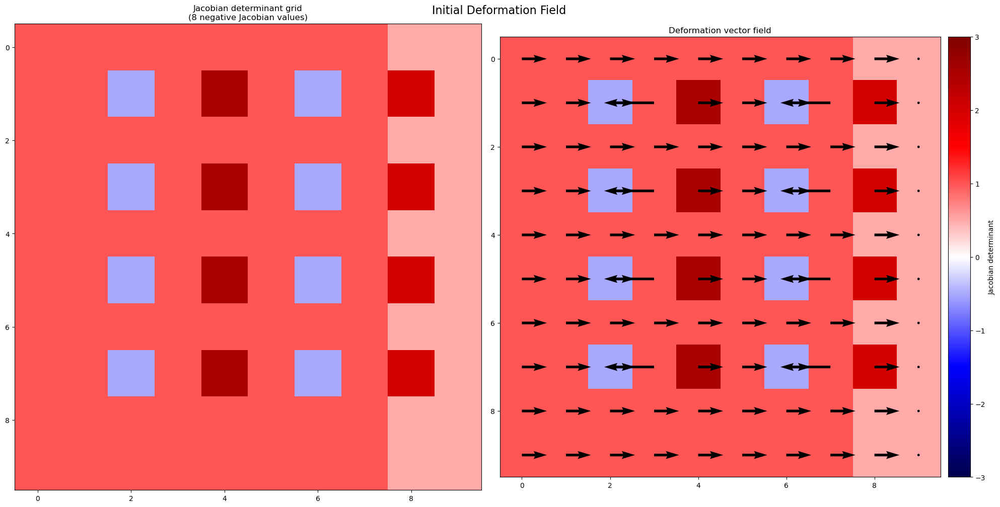

In [127]:
save_path = "paper_outputs/experiments/checkerboard/phi.npy"

deformation_test = np.zeros((3, 1, 10, 10), dtype=np.float32)
deformation_test[2, 0, :, :-1] = 1
deformation_test[2, 0, 1, 3] = -2
deformation_test[2, 0, 3, 3] = -2
deformation_test[2, 0, 5, 3] = -2
deformation_test[2, 0, 7, 3] = -2

deformation_test[2, 0, 1, 7] = -2
deformation_test[2, 0, 3, 7] = -2
deformation_test[2, 0, 5, 7] = -2
deformation_test[2, 0, 7, 7] = -2


plot_deformation(np.array([[0, 0, 0]]), np.array([[0, 0, 0]]), deformation_test,
                 title="Initial Deformation Field", show_values=False, show_points=False,
                 save_path=save_path)

np.save(save_path, deformation_test)
#deformation_iter = np.load("paper_outputs/experiments/checkerboard/phi.npy")
# Process iterative SLSQP deformation
#zeros = np.zeros((1, deformation_iter.shape[1], deformation_iter.shape[2]))
#deformation_iter = np.concatenate([zeros, deformation_iter], axis=0)
#deformation_iter = deformation_iter[:, np.newaxis, :, :]

Checkerboard image shape: (1, 10, 10, 3)


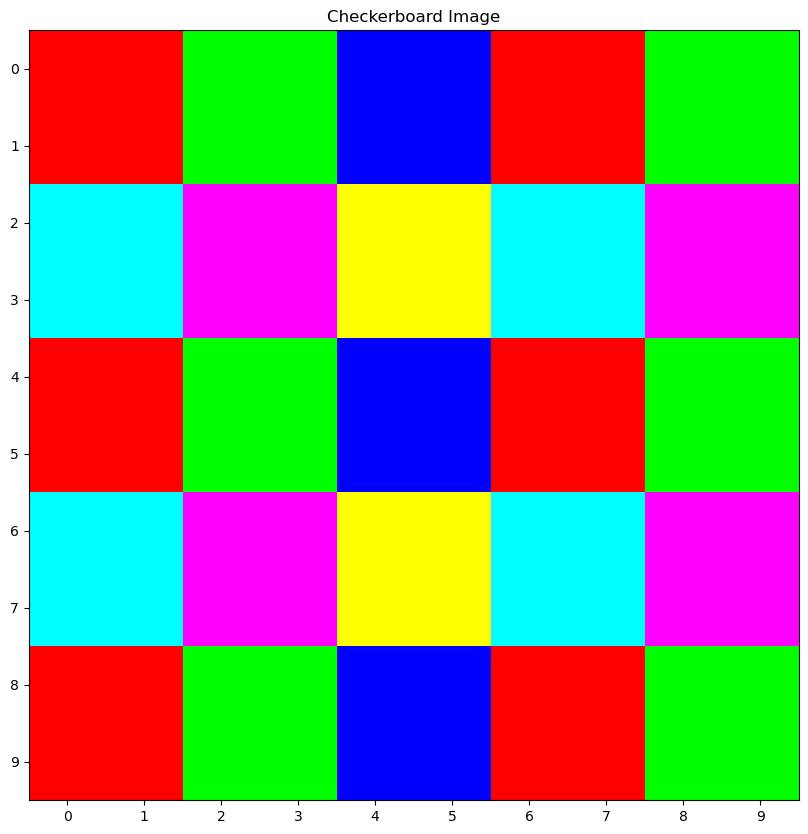

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.2182557e-17..1.0].


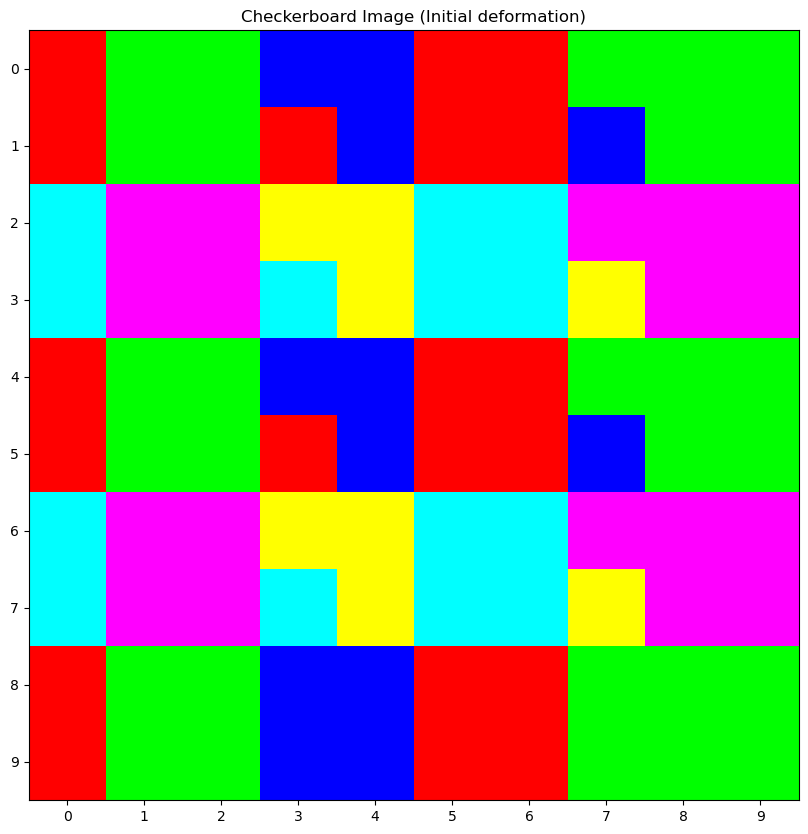

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.2182557e-17..1.0].


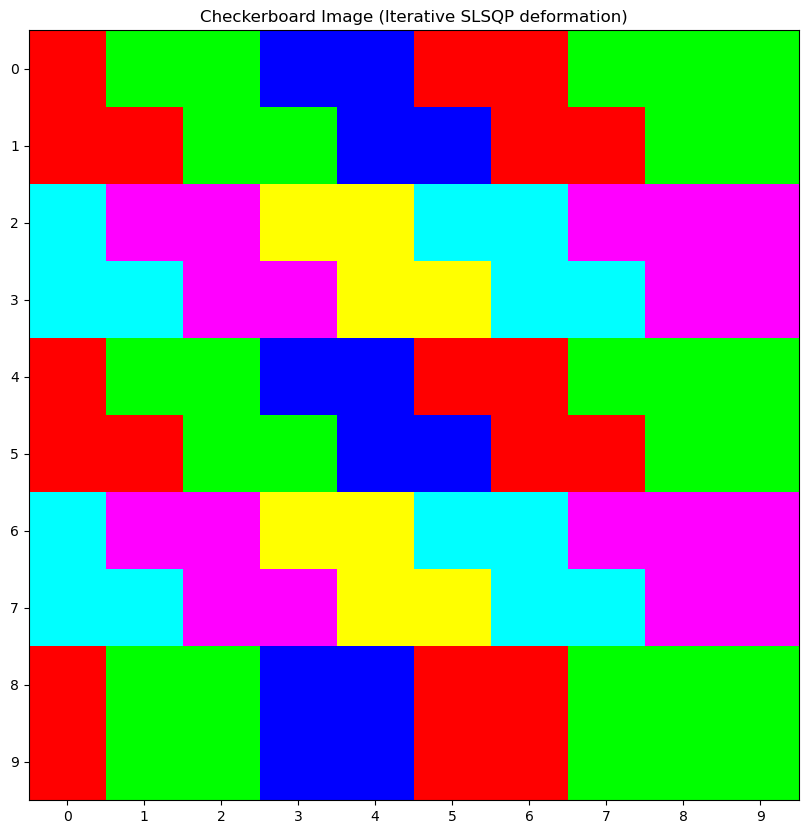

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.2182557e-17..1.0].


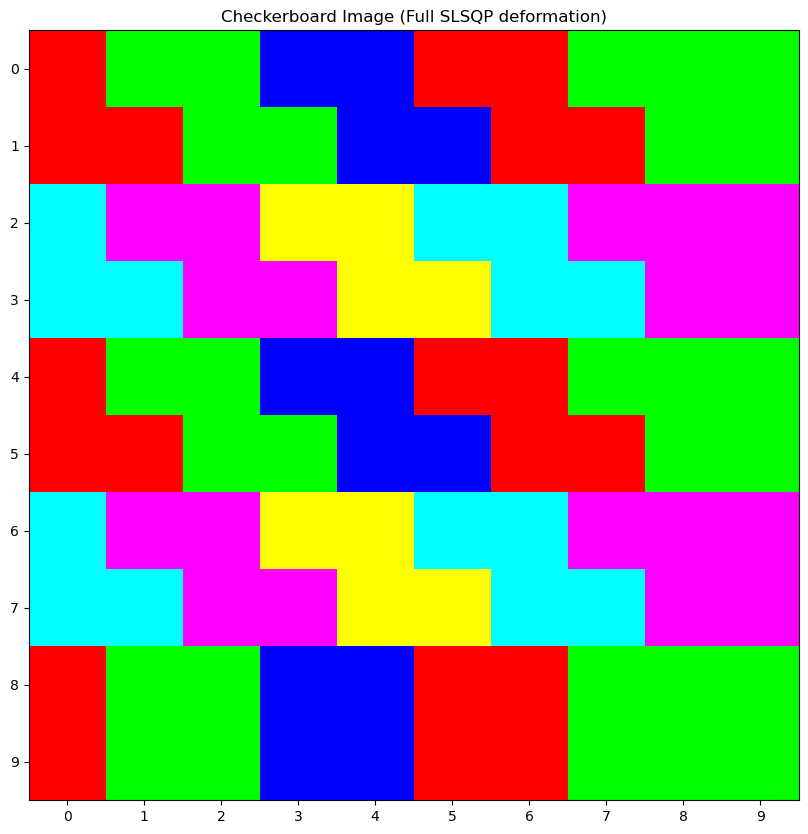

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.2182557e-17..1.0].


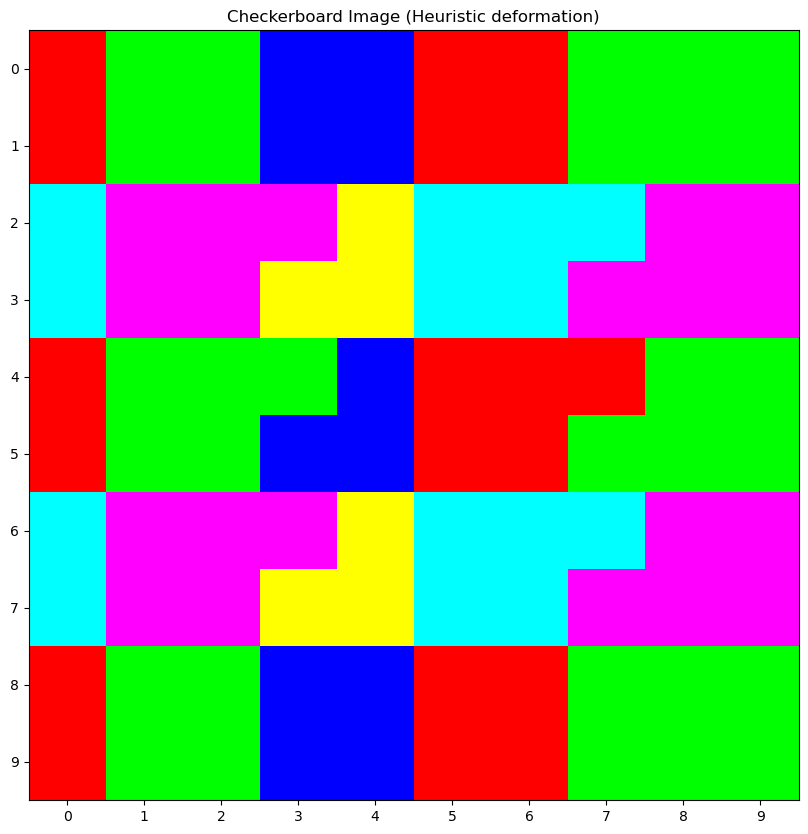

In [132]:
# Example usage
num_squares = (5, 5)  # Number of squares in the checkerboard (64, 90) default, 190/140 is also good
image_resolution = (10, 10)
fig_save_folder = "paper_outputs/experiments/checkerboard/"

checkerboard_img = create_rgb_cmy_checkerboard_alt_rows(num_squares=num_squares, final_resolution=image_resolution)
checkerboard_img = np.expand_dims(checkerboard_img, axis=0) # Add a new axis to make it 3D

print(f"Checkerboard image shape: {checkerboard_img.shape}")

# 122, 237
neg_jacobian_at = (1, 3)
box_size = 3

transformed_initial = transform_image(checkerboard_img, deformation_initial)
transformed_iter = transform_image(checkerboard_img, deformation_iter)
transformed_full = transform_image(checkerboard_img, deformation_full)
transformed_heuristic = transform_image(checkerboard_img, deformation_heuristic)

# Threshold the transformed checkerboard to create a binary image
#transformed_checkerboard = np.where(transformed_checkerboard > 0.5, 1, 0)

# Display the image
plt.figure(figsize=(10, 10))
plt.imshow(checkerboard_img[0], cmap='gray', interpolation='nearest')
plt.title('Checkerboard Image')
plt.xticks(range(0, 10))
plt.yticks(range(0, 10)) 
plt.savefig(fig_save_folder + "01_checkerboard_image.png", bbox_inches='tight')
plt.show()

# Display the image (initial deformation checkerboard)
plt.figure(figsize=(10, 10))
plt.imshow(transformed_initial[0], cmap='gray', interpolation='nearest')
plt.title('Checkerboard Image (Initial deformation)')
plt.xticks(range(0, 10))
plt.yticks(range(0, 10)) 
# Add a blue rectangle
rect = patches.Rectangle((neg_jacobian_at[1] - box_size // 2, neg_jacobian_at[0] - box_size // 2), box_size, box_size,
                        linewidth=2, edgecolor='black', facecolor='none')
#plt.gca().add_patch(rect)
plt.savefig(fig_save_folder + "02_checkerboard_initial_deformation.png", bbox_inches='tight')
plt.show()

# Display the image (iterative deformation checkerboard)
plt.figure(figsize=(10, 10))
plt.imshow(transformed_iter[0], cmap='gray', interpolation='nearest')
plt.title('Checkerboard Image (Iterative SLSQP deformation)')
plt.xticks(range(0, 10))
plt.yticks(range(0, 10)) 
# Add a blue rectangle
rect = patches.Rectangle((neg_jacobian_at[1] - box_size // 2, neg_jacobian_at[0] - box_size // 2), box_size, box_size,
                        linewidth=2, edgecolor='black', facecolor='none')
#plt.gca().add_patch(rect)
plt.savefig(fig_save_folder + "03_checkerboard_iterative_slsqp.png", bbox_inches='tight')
plt.show()


# Display the image (Full SLSQP deformation checkerboard)
plt.figure(figsize=(10, 10))
plt.imshow(transformed_full[0], cmap='gray', interpolation='nearest')
plt.title('Checkerboard Image (Full SLSQP deformation)')
plt.xticks(range(0, 10))
plt.yticks(range(0, 10)) 
# Add a blue rectangle
rect = patches.Rectangle((neg_jacobian_at[1] - box_size // 2, neg_jacobian_at[0] - box_size // 2), box_size, box_size,
                        linewidth=2, edgecolor='black', facecolor='none')
#plt.gca().add_patch(rect)
plt.savefig(fig_save_folder + "04_checkerboard_full_slsqp.png", bbox_inches='tight')
plt.show()

# Display the image (heuristic deformation checkerboard)
plt.figure(figsize=(10, 10))
plt.imshow(transformed_heuristic[0], cmap='gray', interpolation='nearest')
plt.title('Checkerboard Image (Heuristic deformation)')
plt.xticks(range(0, 10))
plt.yticks(range(0, 10)) 
# Add a blue rectangle
rect = patches.Rectangle((neg_jacobian_at[1] - box_size // 2, neg_jacobian_at[0] - box_size // 2), box_size, box_size,
                        linewidth=2, edgecolor='black', facecolor='none')
#plt.gca().add_patch(rect)
plt.savefig(fig_save_folder + "05_checkerboard_heuristic.png", bbox_inches='tight')
plt.show()

In [156]:
import numpy as np
import matplotlib.pyplot as plt

def plot_2d_deformation_grid(deformation, spacing=10, xlim=None, ylim=None, title="2D Deformation Grid"):
    """
    Visualizes a deformation field of shape (3,1,Y,X) as a deformed grid.

    Parameters:
    - deformation: numpy array of shape (3, 1, Y, X) with (z, y, x) displacements
    - spacing: int, spacing between grid lines
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]  # y displacement
    dx = deformation[2, 0]  # x displacement

    # Create grid
    y_coords, x_coords = np.meshgrid(np.arange(0, H, spacing),
                                     np.arange(0, W, spacing),
                                     indexing='ij')

    # Sample displacements at grid points
    sampled_dy = dy[y_coords, x_coords]
    sampled_dx = dx[y_coords, x_coords]

    # Apply deformation
    new_y = y_coords + sampled_dy
    new_x = x_coords + sampled_dx

    # Plot
    plt.figure(figsize=(8, 8))
    for i in range(y_coords.shape[0]):
        #plt.plot(x_coords[i, :], y_coords[i, :], 'k--', linewidth=0.5)  # original
        plt.plot(new_x[i, :], new_y[i, :], 'r-')  # deformed

    for j in range(x_coords.shape[1]):
        #plt.plot(x_coords[:, j], y_coords[:, j], 'k--', linewidth=0.5)
        plt.plot(new_x[:, j], new_y[:, j], 'r-')

    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.title(title)
    if xlim is not None:
        plt.xlim(xlim)
    if ylim is not None:
        plt.ylim(ylim)
    plt.show()

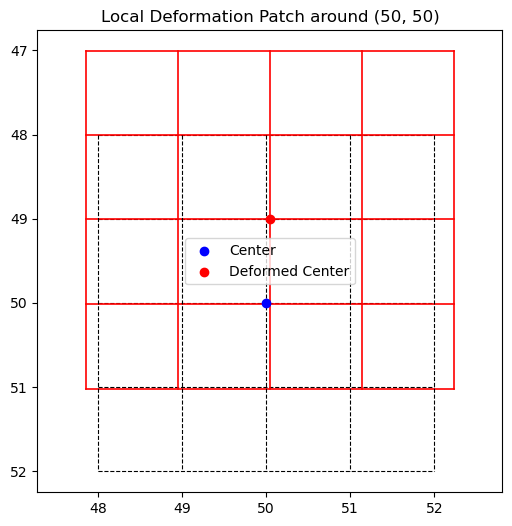

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_local_deformation_patch(deformation, center_y, center_x, patch_size=3):
    """
    Show local deformation around a specific coordinate.

    Parameters:
    - deformation: (3,1,Y,X) array with (z,y,x) displacements
    - center_y, center_x: center of the local neighborhood
    - patch_size: must be odd (e.g., 3, 5)
    """
    assert patch_size % 2 == 1, "Patch size must be odd"
    half = patch_size // 2
    _, _, H, W = deformation.shape

    # Clip to boundaries
    y_start = max(center_y - half, 0)
    y_end   = min(center_y + half + 1, H)
    x_start = max(center_x - half, 0)
    x_end   = min(center_x + half + 1, W)

    # Get coordinate grid in the patch
    y_coords, x_coords = np.meshgrid(np.arange(y_start, y_end),
                                     np.arange(x_start, x_end),
                                     indexing='ij')

    # Get displacements
    dy_patch = deformation[1, 0, y_start:y_end, x_start:x_end]
    dx_patch = deformation[2, 0, y_start:y_end, x_start:x_end]

    # New (deformed) positions
    new_y = y_coords + dy_patch
    new_x = x_coords + dx_patch
    
    

    # Plot
    plt.figure(figsize=(6, 6))
    for i in range(y_coords.shape[0]):
        plt.plot(x_coords[i, :], y_coords[i, :], 'k--', linewidth=0.8)
        plt.plot(new_x[i, :], new_y[i, :], 'r-', linewidth=1.2)

    for j in range(x_coords.shape[1]):
        plt.plot(x_coords[:, j], y_coords[:, j], 'k--', linewidth=0.8)
        plt.plot(new_x[:, j], new_y[:, j], 'r-', linewidth=1.2)

    plt.scatter(center_x, center_y, color='blue', label='Center', zorder=5)
    plt.scatter(center_x + deformation[2, 0, center_y, center_x],
                center_y + deformation[1, 0, center_y, center_x],
                color='red', label='Deformed Center', zorder=5)

    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.title(f"Local Deformation Patch around ({center_y}, {center_x})")
    plt.legend()
    plt.show()



# Example usage
if __name__ == "__main__":
    Y, X = 100, 100
    deformation = np.zeros((3, 1, Y, X))
    deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None]
    deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :]

    plot_local_deformation_patch(deformation, center_y=50, center_x=50, patch_size=5)


Coordinates with negative Jacobian determinant:
[0 2 0]
[0 2 1]
[0 2 2]
[0 2 7]
[0 2 8]
[ 0  2 12]
[ 0  2 13]
[ 0  2 17]
[ 0  2 18]
[0 8 0]
[0 8 1]
[0 8 2]
[0 8 7]
[0 8 8]
[ 0  8 12]
[ 0  8 13]
[ 0  8 17]
[ 0  8 18]
[ 0 15  0]
[ 0 15  1]
[ 0 15  2]
[ 0 15  7]
[ 0 15  8]
[ 0 15 12]
[ 0 15 13]
[ 0 15 17]
[ 0 15 18]
[ 0 15 19]


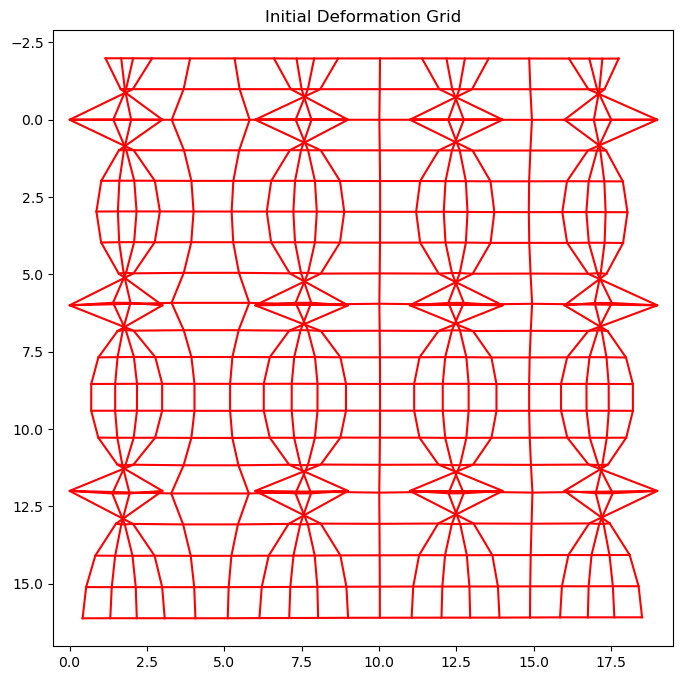

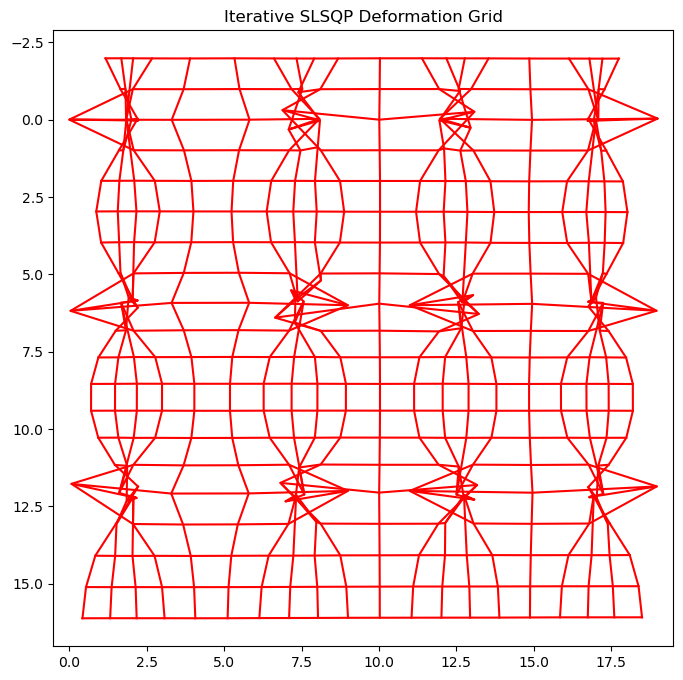

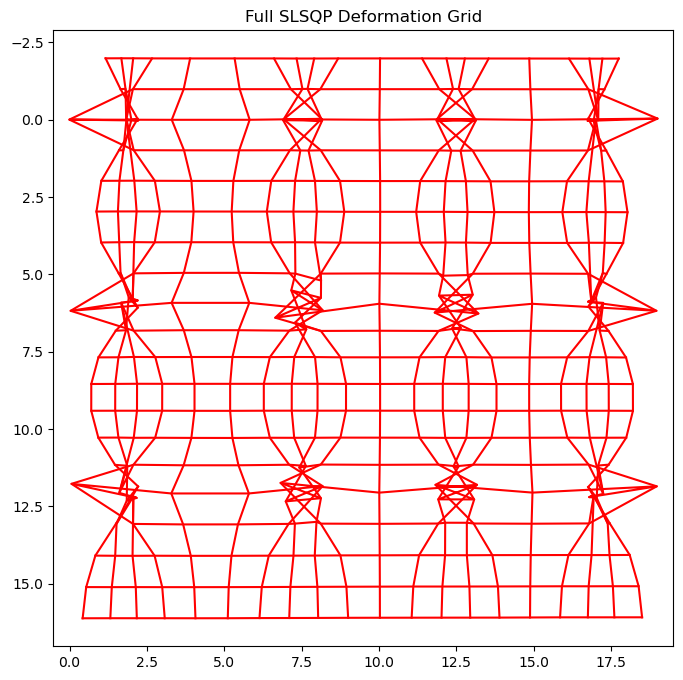

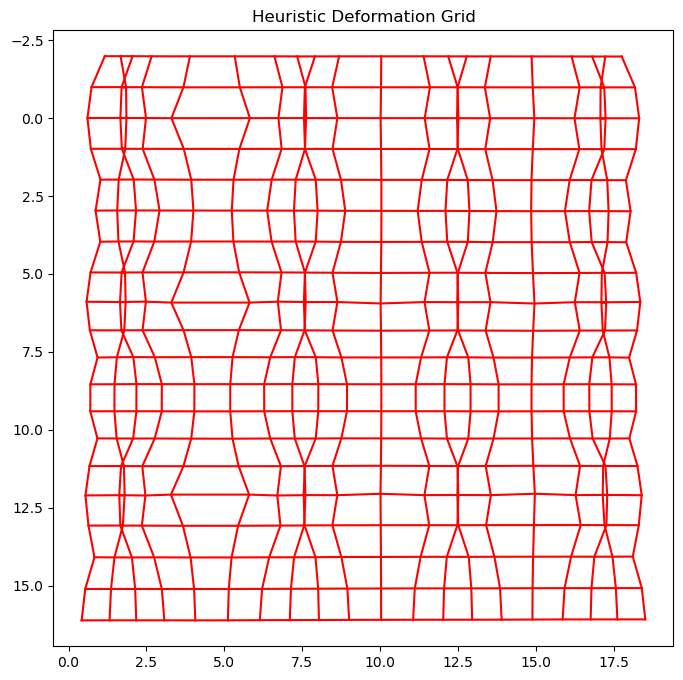

In [200]:
# Example usage (generate a sample field if needed)
#Y, X = 20, 20
spacing = 1
ylim = (25, 35)
xlim = (40, 45)
ylim = (40, 50)
xlim = (40, 45)
xlim = None
ylim = None

# Paths to deformation fields
deformation_initial_path = "experiments/02c_320x456_slice350.npy"
deformation_iter_path = "paper_outputs/experiments/iterative_slsqp/full_resolution/real_data_slice350_full/phi.npy"
#deformation_full_path = "experiments/02c_64x91_slice350.npy"
deformation_heuristic_path = "paper_outputs/experiments/heuristic/full_resolution/real_data_slice350_full/phi.npy"

deformation_initial_path = "experiments/03d_20x20_crossing.npy"
deformation_iter_path = "paper_outputs/experiments/iterative_slsqp/20x20/crossing/phi.npy"
deformation_full_path = "paper_outputs/experiments/full_slsqp/20x20/crossing/20x20_crossing.npy"
deformation_heuristic_path = "paper_outputs/experiments/heuristic/20x20/crossing/phi.npy"

#deformation_initial_path = "experiments/02c_64x91_slice350.npy"
#deformation_iter_path = "paper_outputs/experiments/iterative_slsqp/64x91/real_data_slice350_64x91/phi.npy"
#deformation_full_path = "paper_outputs/experiments/full_slsqp/64x91/slice350/64x91_slice350.npy"
#deformation_heuristic_path = "paper_outputs/experiments/heuristic/64x91/real_data_slice350_64x91/phi.npy"



# Create a sample deformation field
"""
deformation = np.zeros((3, 1, Y, X))
deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None]  # y
deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :]  # x
"""

deformation_initial = np.load(deformation_initial_path)
deformation_iter = np.load(deformation_iter_path)
deformation_full = np.load(deformation_full_path)
deformation_heuristic = np.load(deformation_heuristic_path)

# Process iterative SLSQP deformation
zeros = np.zeros((1, deformation_iter.shape[1], deformation_iter.shape[2]))
deformation_iter = np.concatenate([zeros, deformation_iter], axis=0)
deformation_iter = deformation_iter[:, np.newaxis, :, :]

# Process full SLSQP deformation
zeros = np.zeros((1, deformation_full.shape[1], deformation_full.shape[2]))
deformation_full = np.concatenate([zeros, deformation_full], axis=0)
deformation_full = deformation_full[:, np.newaxis, :, :]

# Compute jacobian for initial deformation field
J = jacobian.sitk_jacobian_determinant(deformation_initial)
# Get coordinates of negative jacobian
neg_jacobian_coords = np.argwhere(J < 0)
# Print the coordinates of negative jacobian
print("Coordinates with negative Jacobian determinant:")
for coord in neg_jacobian_coords:
    print(coord)
    
# Round every displacement vector to the nearest integer
"""
deformation_initial = np.round(deformation_initial).astype(np.int32)
deformation_iter = np.round(deformation_iter).astype(np.int32)
deformation_full = np.round(deformation_full).astype(np.int32)
deformation_heuristic = np.round(deformation_heuristic).astype(np.int32)
"""

plot_2d_deformation_grid(deformation_initial, spacing=spacing, title="Initial Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_iter, spacing=spacing, title="Iterative SLSQP Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_full, spacing=spacing, title="Full SLSQP Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_heuristic, spacing=spacing, title="Heuristic Deformation Grid", xlim=xlim, ylim=ylim)


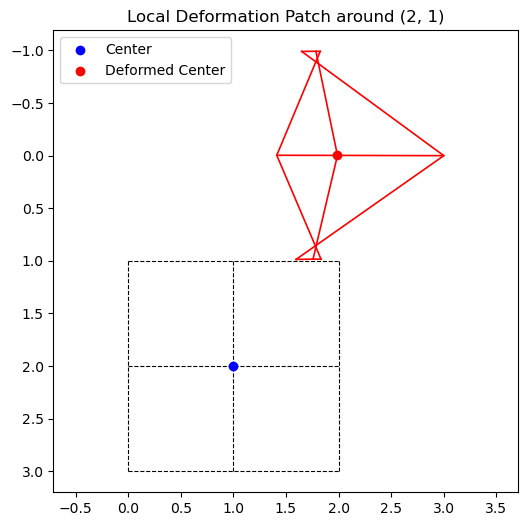

IndexError: index 29 is out of bounds for axis 2 with size 20

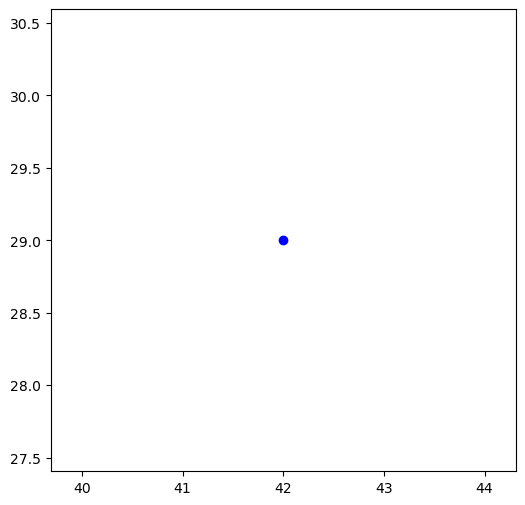

In [201]:
plot_local_deformation_patch(deformation_initial, center_y=2, center_x=1, patch_size=3)
plot_local_deformation_patch(deformation_iter, center_y=29, center_x=42, patch_size=3)
plot_local_deformation_patch(deformation_full, center_y=29, center_x=42, patch_size=3)
plot_local_deformation_patch(deformation_heuristic, center_y=29, center_x=42, patch_size=3)


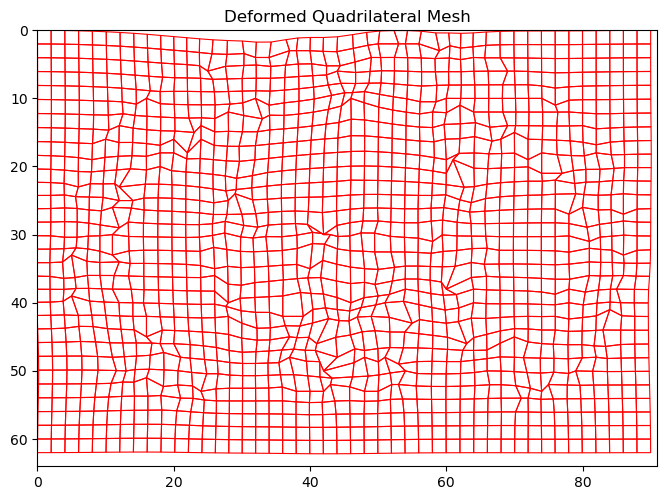

In [189]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

def plot_deformed_quads(deformation, spacing=5, ax=None):
    """
    Plot the deformation as a quadrilateral mesh to check for local invertibility.
    
    deformation: np.ndarray of shape (3, 1, Y, X) - (z, y, x) displacements
    spacing: int, sampling spacing for grid
    ax: matplotlib axis (optional)
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 8))

    for i in range(0, H - spacing, spacing):
        for j in range(0, W - spacing, spacing):
            # Original corners of the grid cell
            pts = [
                (j, i),                             # top-left
                (j + spacing, i),                   # top-right
                (j + spacing, i + spacing),         # bottom-right
                (j, i + spacing),                   # bottom-left
            ]

            # Deform each corner
            deformed_pts = []
            for x, y in pts:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                deformed_pts.append((x_def, y_def))

            # Plot deformed quad
            polygon = Polygon(deformed_pts, closed=True, edgecolor='red', facecolor='none', linewidth=0.8)
            ax.add_patch(polygon)

    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)
    ax.set_aspect('equal')
    ax.set_title("Deformed Quadrilateral Mesh")
    return ax

# Example usage
if __name__ == "__main__":
    Y, X = 100, 100
    deformation = np.zeros((3, 1, Y, X))
    deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None] * 2
    deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :] * 2

    plot_deformed_quads(deformation_initial, spacing=2)
    plt.show()


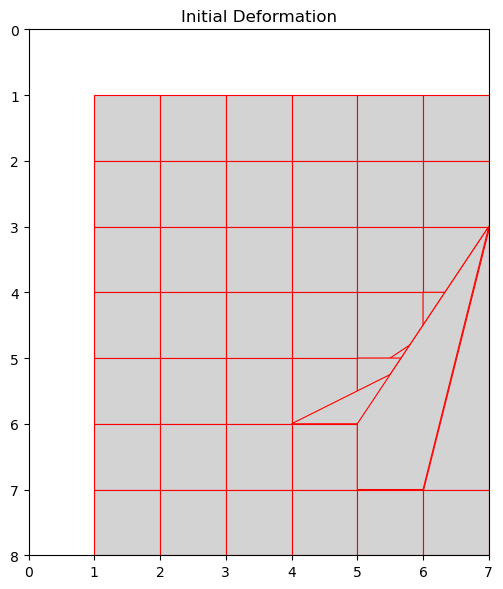

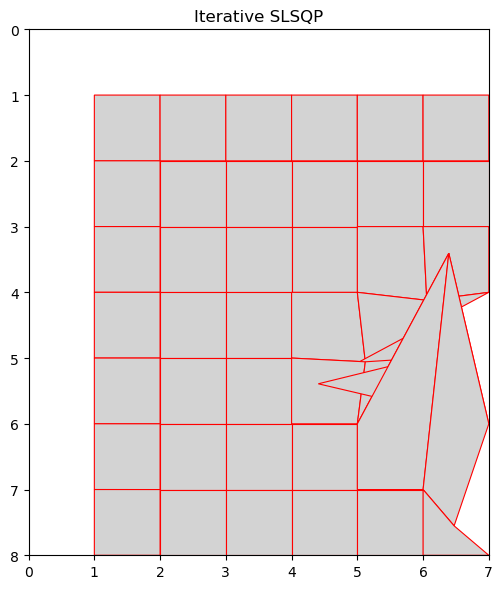

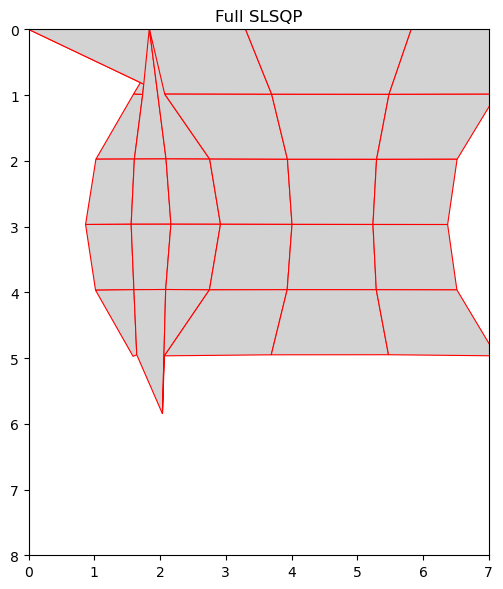

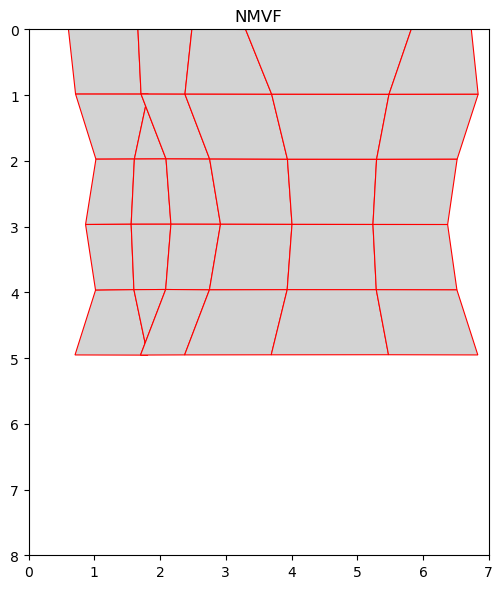

In [335]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

def plot_deformed_quads_zoom(deformation, center_y, center_x, spacing=5, patch_size=40, title=""):
    """
    Plot a zoomed-in quadrilateral mesh of the deformation around a given coordinate.

    Parameters:
    - deformation: (3,1,Y,X) array of (z, y, x) displacements
    - center_y, center_x: center of the region to visualize
    - spacing: grid spacing (in pixels) between samples
    - patch_size: width/height of zoom window in pixels
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    # Define bounding box
    y_start = max(center_y - patch_size // 2, 0)
    y_end   = min(center_y + patch_size // 2, H - spacing - 1)
    x_start = max(center_x - patch_size // 2, 0)
    x_end   = min(center_x + patch_size // 2, W - spacing - 1)

    fig, ax = plt.subplots(figsize=(6, 6))

    for i in range(y_start, y_end, spacing):
        for j in range(x_start, x_end, spacing):
            # Original quad corners
            pts = [
                (j, i),
                (j + spacing, i),
                (j + spacing, i + spacing),
                (j, i + spacing)
            ]

            # Apply deformation to corners
            deformed_pts = []
            for x, y in pts:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                deformed_pts.append((x_def, y_def))

            # Draw quad
            polygon = Polygon(deformed_pts, closed=True, edgecolor='red', facecolor='lightgray', linewidth=0.8)
            ax.add_patch(polygon)

    # Draw original center for reference
    #ax.scatter([center_x], [center_y], color='blue', label='Center', zorder=5)
    ax.set_xlim(x_start, x_end + spacing)
    ax.set_ylim(y_end + spacing, y_start)
    
    #ax.set_xlim(0.5, x_end + spacing)
    #ax.set_ylim(6, y_start)
    
    ax.set_aspect('equal')
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# Test with a synthetic deformation
Y, X = 20, 20
deformation = np.zeros((3, 1, Y, X))
deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None] * 2
deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :] * 2

# Zoom in on a region (e.g. center of the image)
patch_size = 11  # Size of the zoomed patch
spacing = 1 # Do 2
plot_deformed_quads_zoom(deformation_initial, center_y=2, center_x=1, spacing=spacing, patch_size=patch_size, title="Initial Deformation")
plot_deformed_quads_zoom(deformation_iter, center_y=2, center_x=1, spacing=spacing, patch_size=patch_size, title="Iterative SLSQP")
plot_deformed_quads_zoom(deformation_full, center_y=2, center_x=1, spacing=spacing, patch_size=patch_size, title="Full SLSQP")
plot_deformed_quads_zoom(deformation_heuristic, center_y=2, center_x=1, spacing=spacing, patch_size=patch_size, title="NMVF")


Coordinates with negative Jacobian determinant:
[0 0]
[0 2]
[ 0 15]
[ 0 17]
[2 0]
[ 2 17]
[8 0]
[ 8 17]
[13  0]
[13 17]


In [305]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap

def compute_jacobian_determinant(deformation):
    """
    Compute the Jacobian determinant of a 2D deformation field (z,y,x) using:
    - Central differences for internal pixels
    - Forward/backward differences at edges
    Returns: (H, W) Jacobian determinant
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    # Compute gradients with fallback at borders
    def gradient_central_with_fallback(f):
        df_dx = np.zeros_like(f)
        df_dy = np.zeros_like(f)

        # Central
        df_dx[:, 1:-1] = (f[:, 2:] - f[:, :-2]) / 2.0
        df_dy[1:-1, :] = (f[2:, :] - f[:-2, :]) / 2.0

        # Forward (left/top edge)
        df_dx[:, 0] = f[:, 1] - f[:, 0]
        df_dy[0, :] = f[1, :] - f[0, :]

        # Backward (right/bottom edge)
        df_dx[:, -1] = f[:, -1] - f[:, -2]
        df_dy[-1, :] = f[-1, :] - f[-2, :]

        return df_dx, df_dy

    dy_dx, dy_dy = gradient_central_with_fallback(dy)
    dx_dx, dx_dy = gradient_central_with_fallback(dx)

    # Compute Jacobian determinant
    det_J = (1 + dx_dx) * (1 + dy_dy) - dx_dy * dy_dx
    return det_J


import SimpleITK as sitk

def compute_jacobian_determinant(deformation_np, spacing=(1.0, 1.0)):
    """
    Compute Jacobian determinant using SimpleITK.
    
    Parameters:
    - deformation_np: NumPy array of shape (3, 1, Y, X) in (z,y,x) order
    - spacing: voxel spacing in (y, x)
    
    Returns:
    - jacobian_determinant_np: NumPy array (Y, X) with Jacobian determinant
    """
    # Extract (y, x) displacements
    dy = deformation_np[1, 0]
    dx = deformation_np[2, 0]
    Y, X = dy.shape

    # Stack into (Y, X, 2) displacement field in (x, y) order
    vector_field = np.stack((dx, dy), axis=-1).astype(np.float32)  # (Y, X, 2)

    # Convert to sitk Image
    displacement_sitk = sitk.GetImageFromArray(vector_field, isVector=True)
    displacement_sitk.SetSpacing(spacing[::-1])  # spacing=(x, y)

    # Compute Jacobian determinant
    jacobian_image = sitk.DisplacementFieldJacobianDeterminant(displacement_sitk)
    jacobian_determinant_np = sitk.GetArrayFromImage(jacobian_image)

    return jacobian_determinant_np



from matplotlib.colors import Normalize, TwoSlopeNorm

def plot_deformed_quads_colored(deformation, center_y, center_x, spacing=5, patch_size=40, cmap='bwr'):
    """
    Plot a zoomed-in quadrilateral mesh colored by Jacobian determinant,
    using a diverging colormap centered at zero (white = 0).
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    # Compute Jacobian determinant
    J = jacobian.sitk_jacobian_determinant(deformation)
    J = np.squeeze(J)  # Remove singleton dimension
    print(f"Minimum Jacobian: {J.min()}, Maximum Jacobian: {J.max()}")

    # Define region bounds
    y_start = max(center_y - patch_size // 2, 0)
    y_end   = min(center_y + patch_size // 2, H - spacing - 1)
    x_start = max(center_x - patch_size // 2, 0)
    x_end   = min(center_x + patch_size // 2, W - spacing - 1)

    # Create diverging colormap: blue < 0 < red, white at 0
    norm = mcolors.TwoSlopeNorm(vmin=min(J.min(), J.min(), -3), vcenter=0, vmax=max(J.max(), J.max(), 3))
    colormap = get_cmap(cmap)  # 'bwr' is good for blue-white-red

    fig, ax = plt.subplots(figsize=(6, 6))

    for i in range(y_start, y_end, spacing):
        for j in range(x_start, x_end, spacing):
            # Grid cell corners
            pts = [
                (j, i),
                (j + spacing, i),
                (j + spacing, i + spacing),
                (j, i + spacing)
            ]

            # Deformed quad corners
            deformed_pts = []
            for x, y in pts:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                deformed_pts.append((x_def, y_def))

            # Color by Jacobian determinant
            color_val = colormap(norm(J[i, j]))
            # If J < 0, outline in bold or special color
            edge_color = 'black'
            line_width = 0.5
            if J[i, j] < 0:
                edge_color = 'yellow'  # Or 'cyan', etc.
                line_width = 2.0

            polygon = Polygon(deformed_pts, closed=True, 
                            edgecolor=edge_color, facecolor=color_val, 
                            linewidth=line_width)
            ax.add_patch(polygon)

    # Draw center point
    ax.scatter([center_x], [center_y], color='blue', label='Center', zorder=5)
    ax.set_xlim(x_start, x_end + spacing)
    ax.set_ylim(y_end + spacing, y_start)
    #ax.set_aspect('equal')
    ax.set_title("Deformed Mesh Colored by Jacobian (Blue=Negative, Red=Positive)")
    ax.legend()

    # Colorbar
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label="Jacobian Determinant")

    plt.tight_layout()
    plt.show()

Y, X = 100, 100
deformation = np.zeros((3, 1, Y, X))
deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None] * 2
deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :] * 2



# Check quads

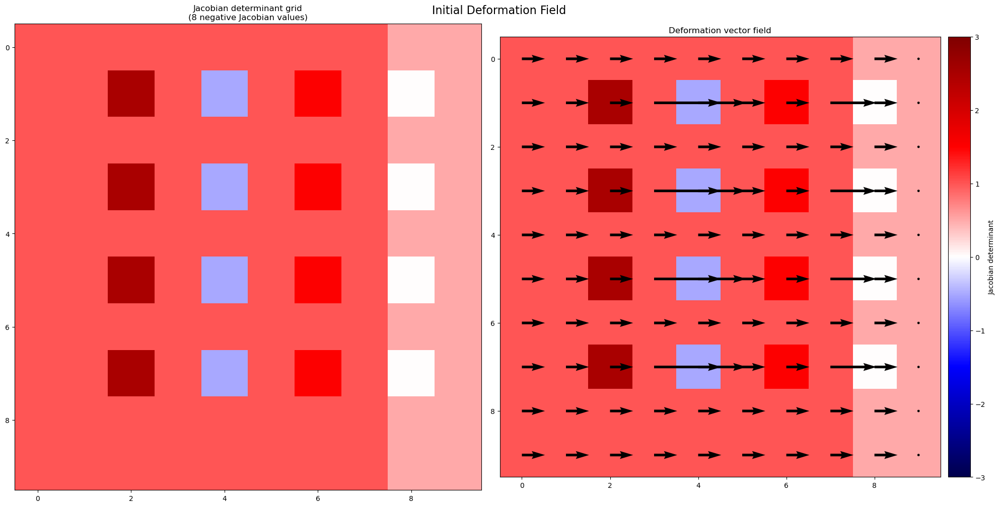

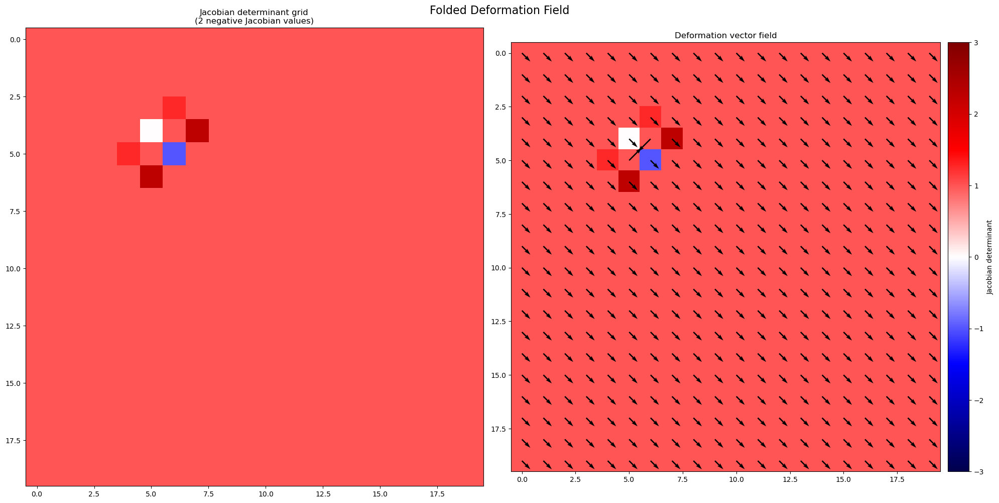

-1.0


In [473]:
save_path = "test.npy"

deformation_test = np.zeros((3, 1, 10, 10), dtype=np.float32)
deformation_test[2, 0, :, :-1] = 1
deformation_test[2, 0, 1, 3] = 4
deformation_test[2, 0, 3, 3] = 4
deformation_test[2, 0, 5, 3] = 4
deformation_test[2, 0, 7, 3] = 4

deformation_test[2, 0, 1, 7] = 2
deformation_test[2, 0, 3, 7] = 2
deformation_test[2, 0, 5, 7] = 2
deformation_test[2, 0, 7, 7] = 2


plot_deformation(np.array([[0, 0, 0]]), np.array([[0, 0, 0]]), deformation_test,
                 title="Initial Deformation Field", show_values=False, show_points=False,
                 save_path=save_path)

np.save(save_path, deformation_test)
#deformation_iter = np.load("paper_outputs/experiments/checkerboard/phi.npy")
# Process iterative SLSQP deformation
#zeros = np.zeros((1, deformation_iter.shape[1], deformation_iter.shape[2]))
#deformation_iter = np.concatenate([zeros, deformation_iter], axis=0)
#deformation_iter = deformation_iter[:, np.newaxis, :, :]




def make_folded_deformation_field():
    """
    Create a 2D deformation field (3, 1, 10, 10) with a local fold that causes a negative Jacobian.
    """
    #deformation = np.ones((3, 1, 10, 10), dtype=np.float32)
    deformation = np.ones((3, 1, 20, 20), dtype=np.float32)

    # Identity mapping (i.e., zero displacement everywhere)

    # Introduce a fold: make a 2x2 patch move in such a way that the quad inverts
    # Bottom-left corner moves up and right
    deformation[1, 0, 5, 5] = -1.5  # y displacement up
    deformation[2, 0, 5, 5] = 1.5   # x displacement right

    # Top-right corner moves down and left
    deformation[1, 0, 4, 6] = 1.5   # y displacement down
    deformation[2, 0, 4, 6] = -1.5  # x displacement left
    
    
    ## 2
    #deformation[1, 0, 2, 2] = -1.5  # y displacement up
    #deformation[2, 0, 2, 2] = -1.5   # x displacement right

    # Top-right corner moves down and left
    #deformation[1, 0, 1,3] = -1.5   # y displacement down
    #deformation[2, 0, 1, 3] = -1.5  # x displacement left
    
    
    #deformation[1, 0, 5, 5] = -1.5  # y displacement up
    #deformation[2, 0, 5, 5] = 1   # x displacement right

    # Top-right corner moves down and left
    #deformation[1, 0, 4, 6] = 1   # y displacement down
    #deformation[2, 0, 4, 6] = 1  # x displacement left
    
    
    # Optional changes
    #deformation[1, 0, 0, 0] = -0.7
    
    #deformation[1, 0, 1, 5] = 0
    #deformation[1, 0, 2, 5] = 0

    #deformation[2, 0, 9, :] = -1

    return deformation


deformation2 = make_folded_deformation_field()
plot_deformation(np.array([[0, 0, 0]]), np.array([[0, 0, 0]]), deformation2,
                 title="Folded Deformation Field", show_values=False, show_points=False)


print(np.min(jacobian.sitk_jacobian_determinant(deformation2)))
np.save("test.npy", deformation2)

In [456]:
compute_jacobian_determinant(deformation_iter)
#jacobian.sitk_jacobian_determinant(deformation_iter)

array([[1.04643518, 0.47516637, 1.51532927, 1.30153316, 1.00000136, 1.00000058, 1.00000057, 1.00000058, 1.00000057, 1.00245125],
       [0.47516638, 1.03352094, 0.79999999, 0.99999587, 0.92817067, 0.99999436, 0.8865621 , 1.00000028, 1.00122561, 1.0036763 ],
       [1.51532925, 0.79999999, 1.00012479, 1.72453923, 1.00000156, 1.3569506 , 0.99999999, 1.16082209, 1.00122534, 1.00245149],
       [1.30153315, 0.9999959 , 1.50878474, 0.99998627, 0.8       , 0.99999999, 0.8       , 1.        , 0.85850142, 1.00253157],
       [1.00000136, 0.96761746, 1.00000157, 1.35680581, 0.99999999, 0.80000001, 1.        , 1.27275614, 1.00453   , 0.94960051],
       [1.00000056, 0.99999435, 0.88641279, 0.99999999, 0.8       , 1.        , 0.8       , 1.07584896, 0.80153414, 1.00268878],
       [1.00000059, 1.00000028, 0.99999999, 1.1607106 , 1.        , 1.2731265 , 0.99999999, 1.64970477, 0.99792068, 1.04003673],
       [1.00000057, 1.00000028, 0.99999999, 1.        , 0.85741346, 0.99999999, 0.8       , 1.000

In [457]:
def plot_2d_deformation_grid(deformation, spacing=10, xlim=None, ylim=None, title="2D Deformation Grid"):
    """
    Visualizes a deformation field of shape (3,1,Y,X) as a deformed grid.

    Parameters:
    - deformation: numpy array of shape (3, 1, Y, X) with (z, y, x) displacements
    - spacing: int, spacing between grid lines
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]  # y displacement
    dx = deformation[2, 0]  # x displacement

    # Create grid
    y_coords, x_coords = np.meshgrid(np.arange(0, H, spacing),
                                     np.arange(0, W, spacing),
                                     indexing='ij')

    # Sample displacements at grid points
    sampled_dy = dy[y_coords, x_coords]
    sampled_dx = dx[y_coords, x_coords]

    # Apply deformation
    new_y = y_coords + sampled_dy
    new_x = x_coords + sampled_dx

    # Plot
    plt.figure(figsize=(8, 8))
    for i in range(y_coords.shape[0]):
        #plt.plot(x_coords[i, :], y_coords[i, :], 'k--', linewidth=0.5)  # original
        plt.plot(new_x[i, :], new_y[i, :], 'r-')  # deformed

    for j in range(x_coords.shape[1]):
        #plt.plot(x_coords[:, j], y_coords[:, j], 'k--', linewidth=0.5)
        plt.plot(new_x[:, j], new_y[:, j], 'r-')
        
    # Draw a scatter plot at 6,6 and its adjacent points
    plt.scatter(6, 4, color='blue', label='Sample Point', zorder=5)
    plt.scatter(6 + dx[4, 6], 4 + dy[4, 6], color='green', label='Deformed Point', zorder=5)
    

    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.title(title)
    if xlim is not None:
        plt.xlim(xlim)
    if ylim is not None:
        plt.ylim(ylim)
    plt.show()



def plot_2d_deformation_grid(deformation, spacing=10, xlim=None, ylim=None, title="2D Deformation Grid", 
                              highlight_point=None):
    """
    Visualizes a deformation field of shape (3,1,Y,X) as a deformed grid.
    Optionally connects the 4-adjacent deformed neighbors of a point with a polygon.

    Parameters:
    - deformation: (3, 1, Y, X)
    - highlight_point: (y, x) of the center point
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    y_coords, x_coords = np.meshgrid(np.arange(0, H, spacing),
                                     np.arange(0, W, spacing),
                                     indexing='ij')
    sampled_dy = dy[y_coords, x_coords]
    sampled_dx = dx[y_coords, x_coords]
    new_y = y_coords + sampled_dy
    new_x = x_coords + sampled_dx

    fig, ax = plt.subplots(figsize=(8, 8))

    # Draw deformed grid
    for i in range(y_coords.shape[0]):
        ax.plot(new_x[i, :], new_y[i, :], 'r-')
    for j in range(x_coords.shape[1]):
        ax.plot(new_x[:, j], new_y[:, j], 'r-')

    if highlight_point:
        cy, cx = highlight_point
        neighbor_offsets = [(-1, 0), (0, 1), (1, 0), (0, -1)]  # top, right, bottom, left
        deformed_pts = []
        
        

        for dy_off, dx_off in neighbor_offsets:
            y, x = cy + dy_off, cx + dx_off
            if 0 <= y < H and 0 <= x < W:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                deformed_pts.append((x_def, y_def))
                ax.scatter(x_def, y_def, color='green', zorder=5)
        ax.scatter(cx + dx[cy, cx], cy + dy[cy, cx], color='blue', zorder=5)  # original point

        # Draw polygon if all 4 neighbors are within bounds
        if len(deformed_pts) == 4:
            xs, ys = zip(*deformed_pts)
            xs += (xs[0],)  # close polygon
            ys += (ys[0],)
            ax.plot(xs, ys, color='black', linewidth=1.5)

    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_title(title)

    if xlim is not None:
        ax.set_xlim(xlim)
    else:
        ax.set_xlim(0, W)

    if ylim is not None:
        ax.set_ylim(ylim)
    else:
        ax.set_ylim(H, 0)

    plt.tight_layout()
    plt.show()


In [470]:
import numpy as np
import matplotlib.pyplot as plt

def plot_2d_deformation_grid(deformation, spacing=10, xlim=None, ylim=None, title="2D Deformation Grid", 
                              highlight_point=None):
    """
    Visualizes a deformation field of shape (3,1,Y,X) as a deformed grid.
    Optionally highlights a point and its neighbors before and after deformation.

    Parameters:
    - deformation: (3, 1, Y, X)
    - highlight_point: (y, x) tuple to mark with scatter (optional)
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    # Create grid
    y_coords, x_coords = np.meshgrid(np.arange(0, H, spacing),
                                     np.arange(0, W, spacing),
                                     indexing='ij')
    sampled_dy = dy[y_coords, x_coords]
    sampled_dx = dx[y_coords, x_coords]
    new_y = y_coords + sampled_dy
    new_x = x_coords + sampled_dx

    # Plot
    plt.figure(figsize=(8, 8))
    for i in range(y_coords.shape[0]):
        plt.plot(new_x[i, :], new_y[i, :], 'r-')
    for j in range(x_coords.shape[1]):
        plt.plot(new_x[:, j], new_y[:, j], 'r-')

    ax = plt.gca()

    # Highlight central point and neighbors
    if highlight_point:
        cy, cx = highlight_point
        neighbors = [(cy, cx),
                     (cy-1, cx), (cy+1, cx),
                     (cy, cx-1), (cy, cx+1)]

        deformed_points = []
        
        for y, x in neighbors:
            if 0 <= y < H and 0 <= x < W:
                # Original position in blue
                #ax.scatter(x, y, color='blue', zorder=5)

                # Deformed position in green
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                
                if y != cy and x != cx:
                    deformed_points.append((x_def, y_def))

                ax.scatter(x_def, y_def, color='green', zorder=5)

        # Draw closed polygon if we have all 4
        if len(deformed_points) == 4:
            xs, ys = zip(*deformed_points)
            ax.plot(xs + (xs[0],), ys + (ys[0],), color='black', linewidth=2)

    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_title(title)

    if xlim is not None:
        ax.set_xlim(xlim)
    else:
        ax.set_xlim(0, W)

    if ylim is not None:
        ax.set_ylim(ylim)
    else:
        ax.set_ylim(H, 0)
        
    ax.axis('off')

    plt.tight_layout()
    plt.show()



# Generate here

Coordinates with negative Jacobian determinant:
[0 5 6]


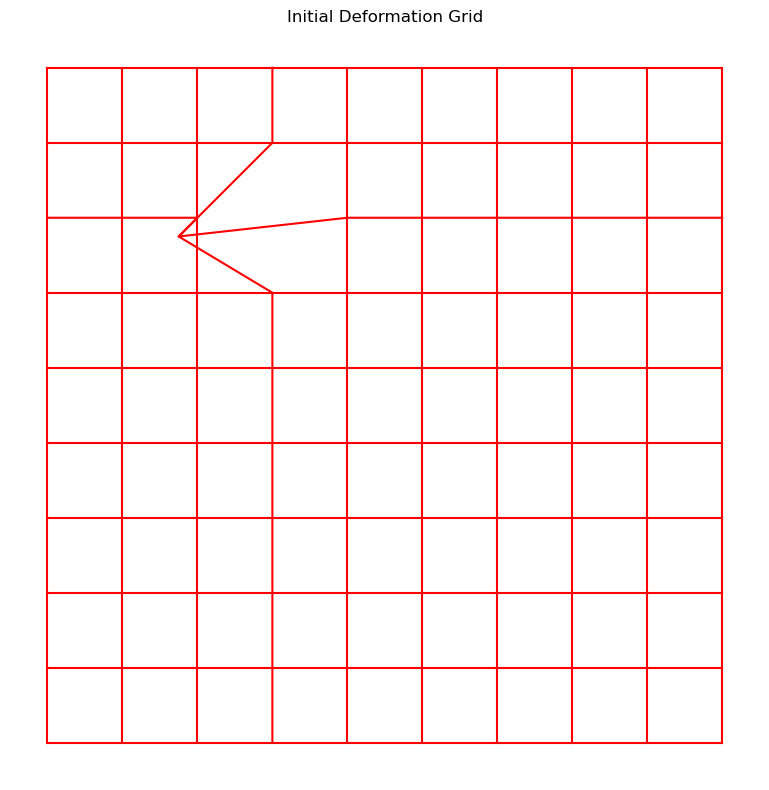

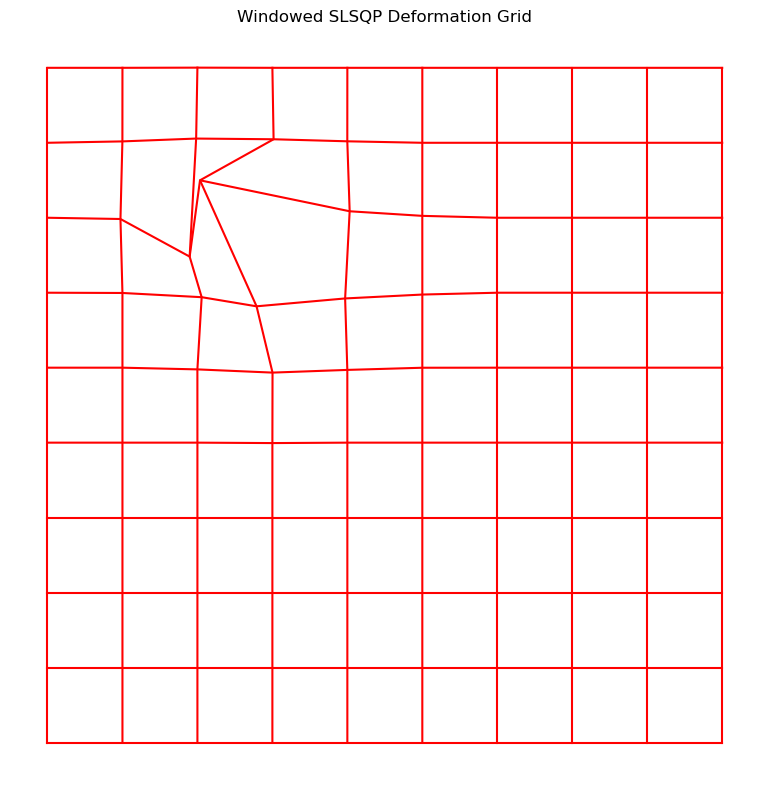

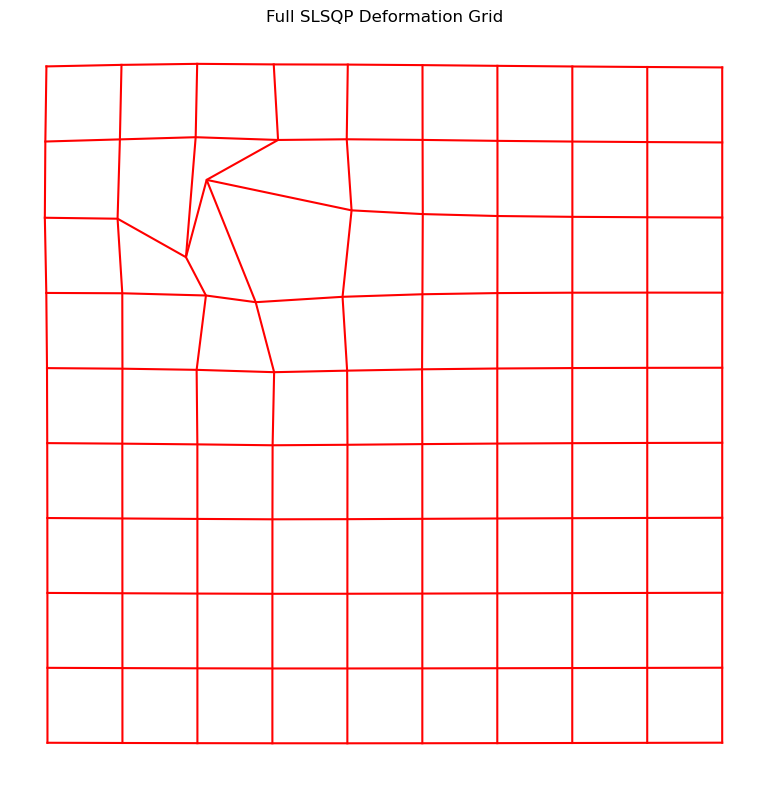

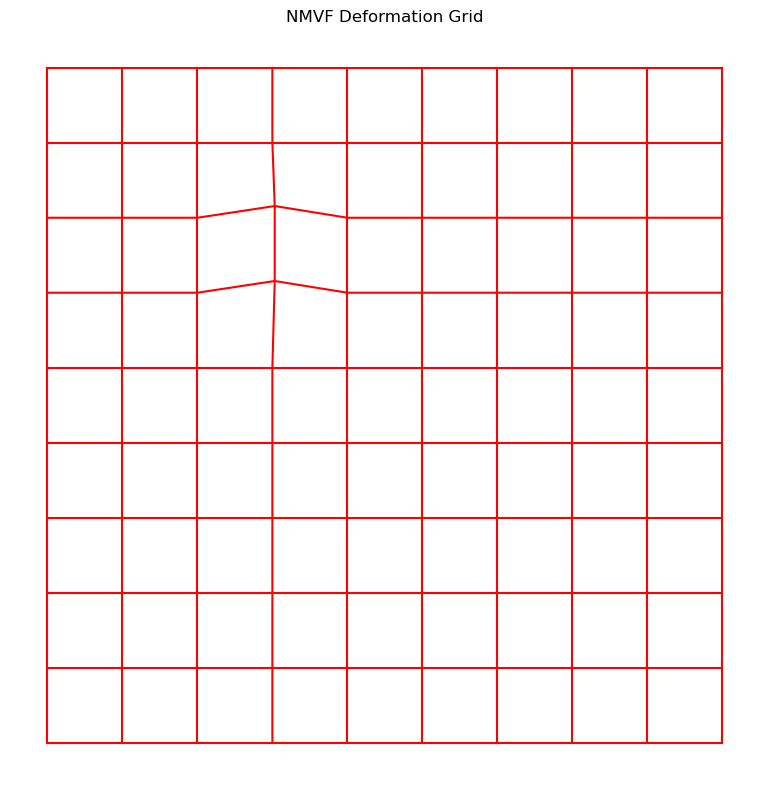

In [475]:

deformation_initial_path = "test.npy"
deformation_iter_path = "test/iterative_slsqp/phi.npy"
deformation_full_path = "test/full_slsqp/phi.npy"
deformation_heuristic_path = "test/heuristic/phi.npy"
spacing = 2

############################################################################################

deformation_initial = np.load(deformation_initial_path)
deformation_iter = np.load(deformation_iter_path)
deformation_full = np.load(deformation_full_path)
deformation_heuristic = np.load(deformation_heuristic_path)

# Process iterative SLSQP deformation
zeros = np.zeros((1, deformation_iter.shape[1], deformation_iter.shape[2]))
deformation_iter = np.concatenate([zeros, deformation_iter], axis=0)
deformation_iter = deformation_iter[:, np.newaxis, :, :]

# Process full SLSQP deformation
zeros = np.zeros((1, deformation_full.shape[1], deformation_full.shape[2]))
deformation_full = np.concatenate([zeros, deformation_full], axis=0)
deformation_full = deformation_full[:, np.newaxis, :, :]

# Compute jacobian for initial deformation field
J = jacobian.sitk_jacobian_determinant(deformation_initial)
# Get coordinates of negative jacobian
neg_jacobian_coords = np.argwhere(J < 0)
# Print the coordinates of negative jacobian
print("Coordinates with negative Jacobian determinant:")
for coord in neg_jacobian_coords:
    print(coord)
    
# Round every displacement vector to the nearest integer
"""
deformation_initial = np.round(deformation_initial).astype(np.int32)
deformation_iter = np.round(deformation_iter).astype(np.int32)
deformation_full = np.round(deformation_full).astype(np.int32)
deformation_heuristic = np.round(deformation_heuristic).astype(np.int32)
"""

plot_2d_deformation_grid(deformation_initial, spacing=spacing, title="Initial Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_iter, spacing=spacing, title="Windowed SLSQP Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_full, spacing=spacing, title="Full SLSQP Deformation Grid", xlim=xlim, ylim=ylim)
plot_2d_deformation_grid(deformation_heuristic, spacing=spacing, title="NMVF Deformation Grid", xlim=xlim, ylim=ylim)

In [465]:
def plot_deformed_quads_colored(deformation, center_y, center_x, spacing=5, patch_size=40, cmap='bwr'):
    """
    Plot a zoomed-in quadrilateral mesh colored by Jacobian determinant,
    using a diverging colormap centered at zero (white = 0).
    """
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    # Compute Jacobian determinant
    J = jacobian.sitk_jacobian_determinant(deformation)
    J = np.squeeze(J)  # Remove singleton dimension
    print(f"Minimum Jacobian: {J.min()}, Maximum Jacobian: {J.max()}")

    # Define region bounds
    y_start = max(center_y - patch_size // 2, 0)
    y_end   = min(center_y + patch_size // 2, H - spacing - 1)
    x_start = max(center_x - patch_size // 2, 0)
    x_end   = min(center_x + patch_size // 2, W - spacing - 1)

    # Create diverging colormap: blue < 0 < red, white at 0
    norm = mcolors.TwoSlopeNorm(vmin=min(J.min(), J.min(), -3), vcenter=0, vmax=max(J.max(), J.max(), 3))
    colormap = get_cmap(cmap)  # 'bwr' is good for blue-white-red

    fig, ax = plt.subplots(figsize=(6, 6))

    for i in range(y_start, y_end, spacing):
        for j in range(x_start, x_end, spacing):
            # Grid cell corners
            pts = [
                (j, i),
                (j + spacing, i),
                (j + spacing, i + spacing),
                (j, i + spacing)
            ]

            # Deformed quad corners
            deformed_pts = []
            for x, y in pts:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                deformed_pts.append((x_def, y_def))

            # Color by Jacobian determinant
            color_val = colormap(norm(J[i, j]))
            # If J < 0, outline in bold or special color
            edge_color = 'black'
            line_width = 0.5
            if J[i, j] < 0:
                edge_color = 'yellow'  # Or 'cyan', etc.
                line_width = 2.0

            polygon = Polygon(deformed_pts, closed=True, 
                            edgecolor=edge_color, facecolor=color_val, 
                            linewidth=line_width)
            ax.add_patch(polygon)

    # Draw center point
    #ax.scatter([center_x], [center_y], color='blue', label='Center', zorder=5)
    ax.set_xlim(x_start, x_end + spacing)
    ax.set_ylim(y_end + spacing, y_start)
    #ax.set_aspect('equal')
    ax.set_title("Deformed Mesh")
    #ax.legend()

    # Colorbar
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label="Jacobian Determinant")

    plt.tight_layout()
    plt.show()

Y, X = 100, 100
deformation = np.zeros((3, 1, Y, X))
deformation[1, 0] = np.sin(np.linspace(0, 3*np.pi, Y))[:, None] * 2
deformation[2, 0] = np.cos(np.linspace(0, 3*np.pi, X))[None, :] * 2



Minimum Jacobian: -0.25, Maximum Jacobian: 2.25


C:\Users\Andy\AppData\Local\Temp\ipykernel_5556\3074010282.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



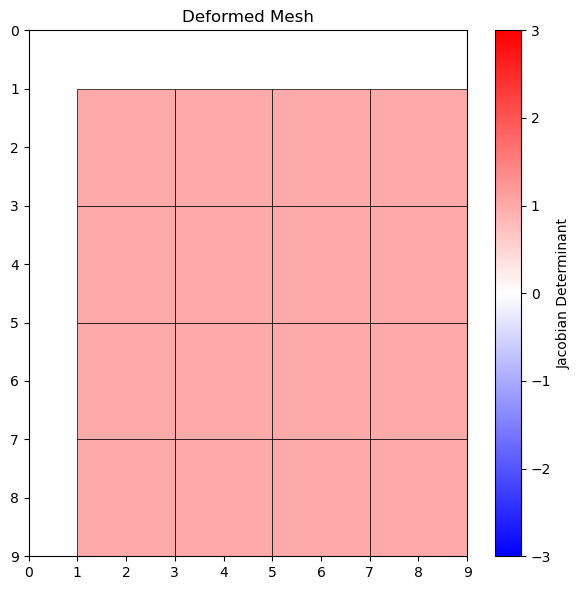

Minimum Jacobian: 0.9653782415219537, Maximum Jacobian: 1.3854981727340907


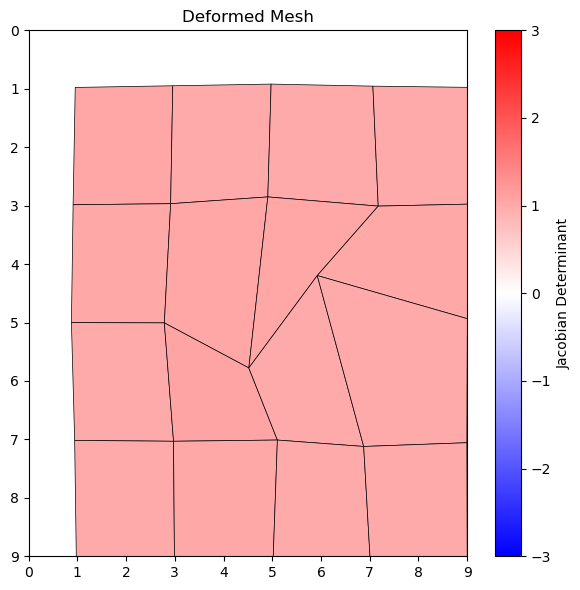

In [423]:
patch_size = 10
spacing = 2
center_y, center_x = 5, 5
plot_deformed_quads_colored(deformation_initial, center_y=center_y, center_x=center_x, spacing=spacing, patch_size=patch_size)
plot_deformed_quads_colored(deformation_iter, center_y=center_y, center_x=center_x, spacing=spacing, patch_size=patch_size)
#plot_deformed_quads_colored(deformation_full, center_y=center_y, center_x=center_x, spacing=spacing, patch_size=patch_size)
#plot_deformed_quads_colored(deformation_heuristic, center_y=center_y, center_x=center_x, spacing=spacing, patch_size=patch_size)

In [326]:
import numpy as np
import plotly.graph_objects as go

def signed_area(p0, p1, p2, p3):
    """Compute signed area of quadrilateral (p0→p1→p2→p3)."""
    def area(a, b, c):
        return 0.5 * ((b[0] - a[0]) * (c[1] - a[1]) - 
                      (c[0] - a[0]) * (b[1] - a[1]))
    # Triangulate quad: p0→p1→p2 and p0→p2→p3
    return area(p0, p1, p2) + area(p0, p2, p3)

def plot_deformed_mesh_with_flips_3d(deformation, center_y, center_x, spacing=1, patch_size=20, zscale=1.0):
    _, _, H, W = deformation.shape
    dy = deformation[1, 0]
    dx = deformation[2, 0]

    y_start = max(center_y - patch_size // 2, 0)
    y_end   = min(center_y + patch_size // 2, H - spacing - 1)
    x_start = max(center_x - patch_size // 2, 0)
    x_end   = min(center_x + patch_size // 2, W - spacing - 1)

    vertices = []
    colors = []
    faces = []

    vert_idx = 0
    for i in range(y_start, y_end, spacing):
        for j in range(x_start, x_end, spacing):
            # Corners of the quad
            corners = [
                (j, i),                     # top-left
                (j + spacing, i),           # top-right
                (j + spacing, i + spacing), # bottom-right
                (j, i + spacing)            # bottom-left
            ]

            # Deformed corner positions
            pts = []
            for x, y in corners:
                x_def = x + dx[y, x]
                y_def = y + dy[y, x]
                z_val = dy[y, x] * zscale
                pts.append((x_def, y_def, z_val))

            # Check for flipped (negative signed area in 2D projection)
            area2d = signed_area(pts[0][:2], pts[1][:2], pts[2][:2], pts[3][:2])
            is_flipped = area2d < 0
            if is_flipped:
                print(f"Flipped quad at ({i}, {j}) with area {area2d:.2f}")

            # Assign color
            color = 'red' if is_flipped else 'lightgray'
            colors.extend([color] * 4)

            # Add vertices
            vertices.extend(pts)

            # Add faces (two triangles per quad)
            faces.append([vert_idx, vert_idx + 1, vert_idx + 2])
            faces.append([vert_idx, vert_idx + 2, vert_idx + 3])
            vert_idx += 4

    x, y, z = np.array(vertices).T
    i, j, k = np.array(faces).T

    # Convert color names to RGB values (lightgray = [211,211,211], red = [255,0,0])
    color_map = {
        'lightgray': 'rgb(211,211,211)',
        'red': 'rgb(255,0,0)'
    }
    face_colors = [color_map[colors[a]] for a in range(0, len(colors), 4) for _ in range(2)]

    fig = go.Figure(data=[
        go.Mesh3d(
            x=x, y=y, z=z,
            i=i, j=j, k=k,
            facecolor=face_colors,
            flatshading=True,
            showscale=False,
            lighting=dict(ambient=0.8),
        )
    ])
    fig.update_layout(
        title="Deformed Mesh with Flipped Quads (Red = Invalid)",
        scene=dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z (Displacement)",
            aspectmode='data'
        ),
        margin=dict(l=0, r=0, t=30, b=0)
    )
    fig.show()
    
plot_deformed_mesh_with_flips_3d(deformation_initial, center_y=3, center_x=4, spacing=1, patch_size=10, zscale=2.0)


Flipped quad at (4, 5) with area -2.00


In [325]:
plot_deformed_mesh_with_flips_3d(deformation_iter, center_y=3, center_x=4, spacing=2, patch_size=10, zscale=1.0)


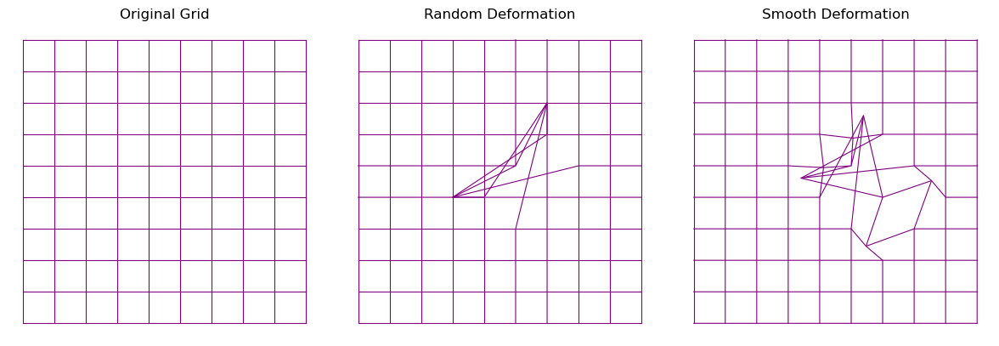

In [352]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# === Global Configuration ===
IMG_SIZE = 10     # Set image size here
SPACING = 1        # Spacing between grid lines
DVF_MAG = 5         # Maximum magnitude of DVF displacement

# === 1. Function to Plot Deformed Grid Lines ===
def plot_deformed_grid(ax, dvf_x, dvf_y, spacing=SPACING, color='purple', label=None):
    H, W = dvf_x.shape
    for x in range(0, W, spacing):
        y = np.arange(H)
        x_coords = np.full_like(y, x)
        x_deformed = x_coords + dvf_x[y, x_coords]
        y_deformed = y + dvf_y[y, x_coords]
        ax.plot(x_deformed, y_deformed, color=color, linewidth=0.8)

    for y in range(0, H, spacing):
        x = np.arange(W)
        y_coords = np.full_like(x, y)
        x_deformed = x + dvf_x[y_coords, x]
        y_deformed = y_coords + dvf_y[y_coords, x]
        ax.plot(x_deformed, y_deformed, color=color, linewidth=0.8)

    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.axis('off')
    if label:
        ax.set_title(label)

# === 2. Generate DVFs ===
def generate_random_dvf(shape=(IMG_SIZE, IMG_SIZE), magnitude=DVF_MAG, smooth=False):
    dvf_x = (np.random.rand(*shape) - 0.5) * 2
    dvf_y = (np.random.rand(*shape) - 0.5) * 2
    if smooth:
        dvf_x = gaussian_filter(dvf_x, sigma=5)
        dvf_y = gaussian_filter(dvf_y, sigma=5)
    norm = np.sqrt(dvf_x**2 + dvf_y**2)
    dvf_x = dvf_x / (norm + 1e-8) * magnitude
    dvf_y = dvf_y / (norm + 1e-8) * magnitude
    return dvf_x, dvf_y

# Identity DVF (no deformation)
zeros = np.zeros((IMG_SIZE, IMG_SIZE))

# Random DVF (unsmoothed)
dvf_x_rand, dvf_y_rand = generate_random_dvf(smooth=False)

# Smooth DVF
dvf_x_smooth, dvf_y_smooth = generate_random_dvf(smooth=True)

# === 3. Plot All Grids ===
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

plot_deformed_grid(axs[0], zeros, zeros, color='purple', label="Original Grid")
plot_deformed_grid(axs[1], deformation_initial[2, 0], deformation_initial[1, 0], color='purple', label="Random Deformation")
plot_deformed_grid(axs[2], deformation_iter[2, 0], deformation_iter[1, 0], color='purple', label="Smooth Deformation")

plt.tight_layout()
plt.show()

In [346]:
dvf_x_smooth.shape

(50, 50)